In [1]:
#####################################################################################################################
#                                                                                                                   #
# Libraries                                                                                                         #
#                                                                                                                   #
#####################################################################################################################
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
import seaborn as sns
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_absolute_error, mean_squared_error

plt.rcParams['figure.dpi'] = 200 # Plot resolution (dpi)
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam, RMSprop, AdamW
import numpy as np
import os
import random
import matplotlib.dates as mdates
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from statsmodels.tsa.vector_ar.var_model import VAR # Import VAR class
from tensorflow.keras import layers, Model, Input
import tensorflow as tf
import math
from copy import deepcopy
import shap
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.regularizers import l2
# Surpressing Warnings
import warnings
import tensorflow as tf

from statsmodels.tools.sm_exceptions import ValueWarning, ConvergenceWarning
# Suppress Keras UserWarning about input shape in RNN layers
warnings.filterwarnings("ignore", category=UserWarning, module='keras')

# Suppress statsmodels ValueWarning about no frequency information
warnings.filterwarnings("ignore", category=ValueWarning, module='statsmodels')

# Suppress statsmodels ConvergenceWarning about optimization failure
warnings.filterwarnings("ignore", category=ConvergenceWarning, module='statsmodels')

# To suppress all TensorFlow warnings
# warnings.filterwarnings('ignore', category=tf.errors.UserWarning)
warnings.filterwarnings('ignore', message="6 out of the last .* calls to .* triggered tf.function retracing.*", category=UserWarning)



# Loading Transformed Data

In [2]:

file_path = '/Users/bodamjerry/Downloads/GermanyMacroData/'
os.chdir(file_path)
print(f"Current working directory: {os.getcwd()}")

t_Data_Dir = 'TData/'
r_State_Dir = "RState/"
all_LagsHICP_Dir = "AllLagsHICP/"
all_LagsCPI_Dir = "AllLagsCPI/"
# all_LagsNonNormCPI_Dir = "AllLagsNNCPI/"
# all_LagsNonNormHICP_Dir = "AllLagsNNHICP/"

# data_unscaled = pd.read_csv(filepath_or_buffer = r_State_Dir + 'data_unscaled.csv')
# data_scaled = pd.read_csv(filepath_or_buffer = r_State_Dir + 'data_scaled.csv')
data = pd.read_csv(filepath_or_buffer = t_Data_Dir + 'full_data_norm.csv')
# data = pd.read_csv(filepath_or_buffer = all_LagsNonNormCPI_Dir + 'data_origin.csv')
data_acf_pacf = pd.read_csv(filepath_or_buffer = t_Data_Dir + 'full_cf_lags_data_norm.csv')

# Consider Creating CSV for Data Description
df_date = pd.to_datetime(data['DATE'])
data.set_index('DATE', inplace=True)
data_acf_pacf.set_index('DATE', inplace=True)
print(data.shape)
print(data.columns)

# data_scaled.set_index('DATE', inplace=True)
# data_unscaled.set_index('DATE', inplace=True)

# print(data_scaled.shape)
# print(data_unscaled.shape)

# print(data_scaled.columns)
# print(data_unscaled.columns)



Current working directory: /Users/bodamjerry/Downloads/GermanyMacroData
(304, 115)
Index(['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
       'RETAILXMV', 'RETAILGSR', 'RETAILGF',
       ...
       'ECBMLFR_L1', 'ECBMLFR_L2', 'ECBMLFR_L3', 'ECBMLFR_L4', 'ECBMLFR_L5',
       'HICP_L1', 'HICP_L2', 'HICP_L3', 'HICP_L4', 'HICP_L5'],
      dtype='object', length=115)


In [3]:
print(data.info())
# print(data_scaled.info())
# # OR
# print(data_unscaled.info())
# 
# print(data_unscaled.dtypes)
main_vars = ['GOODFBT', 'ECBIRRO', 'UNERWG', 'IPI', 'LTIR', 'RETAILGSR', 'RETAILXMV', 'ECBDFR', 'MMR', 'RETAILMV', 'AGRPROD', 'EPI', 'RETAILGF', 'PPIIP', 'UR', 'CPI', 'WPI', 'ECBMLFR', 'HICP', 'CPI_t+1']

<class 'pandas.core.frame.DataFrame'>
Index: 304 entries, 1999-09-01 to 2024-12-01
Columns: 115 entries, UNERWG to HICP_L5
dtypes: float64(115)
memory usage: 275.5+ KB
None


# Utility Functions

In [4]:

sns.set_theme(style="whitegrid") # Apply seaborn visual theme

def plot_forecast(forecasted_series, actual_series, title_name='Forecasted vs Actual CPIAUCSL'):

    fig = plt.figure(figsize=(12, 6)) # Store figure object

    actual_series.index = pd.to_datetime(actual_series.index) # Try converting to DateTimeIndex

    plt.plot(actual_series.index, forecasted_series, label='Forecasted', color='#e41a1c', linestyle='dashed', linewidth=2) # Red for forecast
    plt.plot(actual_series.index, actual_series, label='Actual', color='#377eb8', linestyle='solid', linewidth=2) # Blue for actual

    plt.xlabel('Date', fontsize=10)
    plt.ylabel('Value', fontsize=10)
    plt.title(title_name, fontsize=12)

    # Date formatting for x-axis (using logic from your improved plot_series)
    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=90, ha='right', fontsize=10) # Rotate x-axis labels, adjust font size
    plt.gcf().autofmt_xdate() # Auto-format dates

    plt.legend(fontsize=10, frameon=True, shadow=False, edgecolor='black')
    plt.grid(True, linestyle='--', alpha=0.7, color='gray')

    # Customize Spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)

    plt.tight_layout() # Adjust layout

    return fig # Return the figure object (do NOT use plt.show() here if you want to control display later)

def plot_observed_vs_fitted_var(var_model_fit, train_df, target_column='CPIAUCSL', title='VAR Model - Observed vs Fitted (Training)'):

    fitted_values = var_model_fit.fittedvalues # Get fitted values from the VAR model
    observed_train = train_df[target_column]   # Observed values from the training data

    # Extract fitted values for the target column
    fitted_cpiauscl = fitted_values[target_column]

    # Ensure index is DateTimeIndex if possible (align with actual_series index if needed)
    try:
        fitted_cpiauscl.index = pd.to_datetime(fitted_cpiauscl.index)
        observed_train.index = pd.to_datetime(observed_train.index) # Align observed index too for plotting
        if not fitted_cpiauscl.index.equals(observed_train.index): # If indexes still not the same, try to align based on actual index
            fitted_cpiauscl.index = observed_train.index # Force index alignment for plotting if possible
    except ValueError:
        print("Warning: Could not convert index to DateTime for Observed vs Fitted plot.")
        pass # Plot without DateTimeIndex if conversion fails

    fig = plt.figure(figsize=(12, 6))

    plt.plot(observed_train.index, observed_train, label="Observed (Train)", linestyle="solid", linewidth=2) # Blue for observed
    plt.plot(fitted_cpiauscl.index, fitted_cpiauscl, label="Fitted (Train)", linestyle="solid", linewidth=2) # Green for fitted

    plt.title(title, fontsize=12)
    plt.xlabel("Date", fontsize=10)
    plt.ylabel("Value", fontsize=10)
    plt.legend(fontsize=10, frameon=True, shadow=False, edgecolor='black')
    plt.grid(True, linestyle='--', alpha=0.7, color='gray')

    # Date formatting for x-axis
    ax = plt.gca()
    locator = mdates.AutoDateLocator() # Use observed_train index for locator
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    # Customize Spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)

    plt.tight_layout()
    plt.show()
    return fig


# Creating Train and Test Data

In [377]:
# horizon_name = f"dfCPI_L1"
# filename = f"{horizon_name}_rolling_data_norm_1.csv"
# file_path = os.path.join(all_LagsCPI_Dir, filename)

# horizon_name = f"dfHICPL1"
# filename = f"{horizon_name}_rolling_data_norm_1.csv"
# file_path = os.path.join(all_LagsHICP_Dir, filename)

# data = pd.read_csv(file_path, index_col=0, parse_dates=True)

# df_date = pd.to_datetime(data['Date'])
# data.set_index(df_date, inplace=True)
print(data.dtypes)

UNERWG     float64
ECBIRRO    float64
ECBDFR     float64
ECBMLFR    float64
MMR        float64
            ...   
HICP_L1    float64
HICP_L2    float64
HICP_L3    float64
HICP_L4    float64
HICP_L5    float64
Length: 115, dtype: object


In [5]:
data_m = data[main_vars]
df_data = data_m.drop(columns=["CPI", "HICP"])
# print(data.columns)
# target = "dfCPI_L1"
target = "CPI_t+1"
target_hicp = "HICP_t+1"

# data = data.drop(columns="HICP")
print(df_data.columns)
# target = horizon_name


Index(['GOODFBT', 'ECBIRRO', 'UNERWG', 'IPI', 'LTIR', 'RETAILGSR', 'RETAILXMV',
       'ECBDFR', 'MMR', 'RETAILMV', 'AGRPROD', 'EPI', 'RETAILGF', 'PPIIP',
       'UR', 'WPI', 'ECBMLFR', 'CPI_t+1'],
      dtype='object')


In [17]:
# df_data = df[['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
#                              'RETAILXMV', 'RETAILGSR', 'RETAILGF', 'GOODFBT', 'AGRPROD', 'PPIIP',
#                              'WPI', 'EPI', 'IPI', 'HICP', 'LTIR', 'UR']]

test_size = int(len(data_m) * 0.2)  # Convert percentage to absolute count
# test_size = 12  # Convert percentage to absolute count

train_df = data_m.iloc[:-test_size]
test_df = data_m.iloc[-test_size:]

print(train_df.shape)
print(test_df.shape)


(244, 20)
(60, 20)


In [18]:
print(train_df[target].tail())
print(test_df[target].head())

print(train_df.columns)


DATE
2019-08-01    0.618788
2019-09-01   -0.100974
2019-10-01   -0.720269
2019-11-01    1.962073
2019-12-01   -1.958963
Name: CPI_t+1, dtype: float64
DATE
2020-01-01    1.239524
2020-02-01   -0.617118
2020-03-01    0.002379
2020-04-01    0.002068
2020-05-01    0.206924
Name: CPI_t+1, dtype: float64
Index(['GOODFBT', 'ECBIRRO', 'UNERWG', 'IPI', 'LTIR', 'RETAILGSR', 'RETAILXMV',
       'ECBDFR', 'MMR', 'RETAILMV', 'AGRPROD', 'EPI', 'RETAILGF', 'PPIIP',
       'UR', 'CPI', 'WPI', 'ECBMLFR', 'HICP', 'CPI_t+1'],
      dtype='object')


# VAR Model Training & Testing
Given that we need more observations than parameters. A rough formula:

Required observations > lag_order × num_variables²

We need to reduce the maxlags or number of variables.


In [19]:

model = VAR(train_df)

# AIC based lag order (your original code)
lag_order_aic = model.select_order(maxlags=5).aic
print(f"AIC-based Lag Order: {lag_order_aic}")

# BIC based lag order
lag_order_bic = model.select_order(maxlags=5).bic
print(f"BIC-based Lag Order: {lag_order_bic}")

# HQIC based lag order
lag_order_hqic = model.select_order(maxlags=5).hqic
print(f"HQIC-based Lag Order: {lag_order_hqic}")

# Choose the lag order based on the criteria you prefer or by comparing performance with different lag orders.
lag_order = lag_order_aic # or lag_order_bic, or lag_order_hqic
var_model = model.fit(lag_order)
print(lag_order)

# var_model.summary()


AIC-based Lag Order: 1
BIC-based Lag Order: 1
HQIC-based Lag Order: 1
1


In [20]:

def var_forecast(model, train_df, test_df, lag_order, forecast_horizon):
    """
    Fits a VAR model and performs rolling forecasts with a flexible step size.

    Parameters:
    - data (pd.DataFrame): Time series dataset
    - steps (int): Forecast horizon (e.g., 1 for one-month-ahead, 2 for two-month-ahead)
    - test_ratio (float): Percentage of data to use for testing (default 20%)

    Returns:
    - forecast_df (pd.DataFrame): Forecasted values
    - mae (float): Mean Absolute Error
    - rmse (float): Root Mean Squared Error
    """

    # Fit the VAR model
    # model = VAR(train_df)
    # var_model = model.fit(lag_order)
    var_model = model

    # Perform rolling forecasts
    predictions = []
    history = train_df.values.tolist()

    for i in range(len(test_df)):  # Ensure valid range

        input_data = np.array(history[-lag_order:])  # Use latest observed data
        forecast = var_model.forecast(input_data, steps=1)  # Forecast for `steps` ahead
        predictions.append(forecast[0])  # Store last step prediction
        history.append(test_df.iloc[i].values.tolist())  # Update with actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, columns=train_df.columns, index=test_df.index[:len(predictions)])

    # Extract actual and forecasted values for CPI
    actual_cpi = test_df[target]
    forecasted_cpi = forecast_df[target]
    # input_data = train_df.values[-lag_order:]
    # forecast = model.forecast(y=input_data, steps=forecast_horizon)
    # 
    # # Build forecast DataFrame
    # forecast_df = pd.DataFrame(forecast, columns=train_df.columns, index=test_df.index)
    # 
    # # -------------------------------
    # # EVALUATE ON TARGET (HICP)
    # # -------------------------------
    # actual_cpi = test_df[target]
    # forecasted_cpi = forecast_df[target]

    mae = mean_absolute_error(actual_cpi, forecasted_cpi)
    rmse = np.sqrt(mean_squared_error(actual_cpi, forecasted_cpi))

    # Compute evaluation metrics
    # mae = mean_absolute_error(actual_cpi, forecasted_cpi)
    # rmse = np.sqrt(mean_squared_error(actual_cpi, forecasted_cpi))

    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")

    return var_model, forecasted_cpi, actual_cpi, train_df, mae, rmse



# ***Results***


Mean Absolute Error (MAE): 0.5186885952892484
Root Mean Squared Error (RMSE): 0.6578583538617034


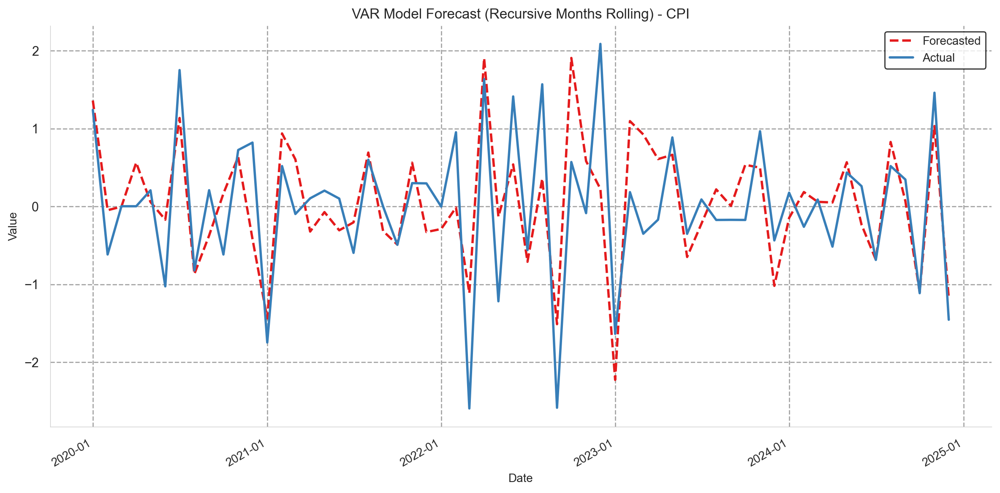

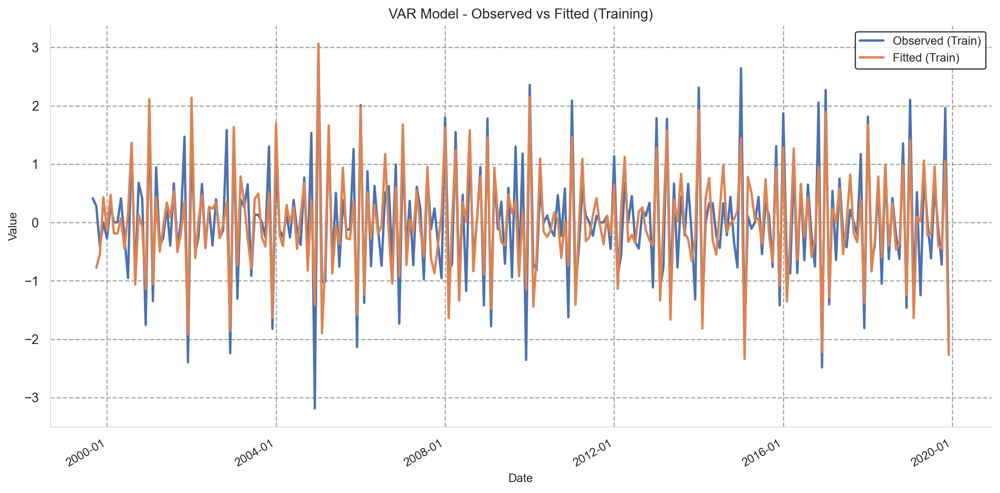

In [21]:
# # Forecast the next 12 months
model, forecasted_cpi, actual_cpi, var_train_df, var_mae, var_rmse = var_forecast(var_model, train_df.copy(), test_df.copy(), lag_order, test_size)
var_model_forecast_plot = plot_forecast(forecasted_cpi, actual_cpi, title_name='VAR Model Forecast (Recursive Months Rolling) - CPI')
var_observed_vs_fitted_plot = plot_observed_vs_fitted_var(model, var_train_df, target, 'VAR Model - Observed vs Fitted (Training)')


# ***ARIMA Training and Test***

In [22]:

# Extract CPI series for ARIMA
train_cpi_arima = train_df.copy()[target]
test_cpi_arima = test_df.copy()[target]

In [23]:
# For ARIMA order selection (non-seasonal):
auto_arima_model_arima = auto_arima(train_cpi_arima, seasonal=False, stepwise=True,
                                    suppress_warnings=True, error_action="ignore", max_order=10, trace=True)



Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=238.947, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=704.707, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=493.009, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=427.596, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=243.284, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=277.831, Time=0.04 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=302.615, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=242.771, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=277.213, Time=0.05 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=211.134, Time=0.26 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 A

In [24]:

def arima_rm_forecast(train_df, test_df, auto_arima_model, forecast_horizon, title='ARIMA: Observed vs Fitted (24 Months Rolling)', target_column=target):
    """
    Performs a rolling multi-step-ahead ARIMA forecast for the entire test dataset.

    Parameters:
    - train_df (pd.DataFrame): Training data
    - test_df (pd.DataFrame): Test data
    - target_column (str): The target variable for evaluation (default 'CPIAUCSL')
    - steps (int): Number of steps ahead for each rolling forecast

    Returns:
    - forecast_df (pd.DataFrame): Forecasted values for the entire test period
    - mae (float): Mean Absolute Error
    - rmse (float): Root Mean Squared Error
    """

    # Extract target series
    train_series = train_df[target_column]
    test_series = test_df[target_column]

    # Perform rolling forecasts
    history = train_series.tolist()
    predictions = []

    for i in range(len(test_series)):
        arima_model = ARIMA(history, order=auto_arima_model.order)  # Refit model each step
        arima_model_fit = arima_model.fit()
        forecast = arima_model_fit.forecast(steps=1)  # Forecast 'steps' ahead
        predictions.append(forecast[-1])  # Store last predicted step
        history.append(test_series.iloc[i])  # Append actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, index=test_series.index, columns=[target_column])

    # Compute evaluation metrics
    mae = mean_absolute_error(test_series, forecast_df[target_column])
    rmse = np.sqrt(mean_squared_error(test_series, forecast_df[target_column]))

    print(f"ARIMA Model - Mean Absolute Error (MAE): {mae:.4f}")
    print(f"ARIMA Model - Root Mean Squared Error (RMSE): {rmse:.4f}")

    # Generate and display plots
    print("Train")
    print(train_df.shape)

    plot_forecast(forecast_df[target_column], test_series, title_name=f'ARIMA -Step Ahead Forecast - {target_column}')
    plot_arima_observed_vs_fitted(arima_model_fit, train_df, target_column=target_column, title=title) # Pass target_column

    plt.show()  # Display plots
    return forecast_df, mae, rmse

def plot_arima_observed_vs_fitted(arima_model_fit, train_data, target_column=target, title='ARIMA Model - Observed vs Fitted (Training)'):
    """
    Plots observed vs fitted values for an ARIMA model on the training data,
    handling cases where fittedvalues might not have an index and ensuring index alignment.
    Includes enhanced index debugging.
    """

    observed_train = train_data[target_column] if isinstance(train_data, pd.DataFrame) else train_data # Handle DataFrame or Series input for train_data
    fitted_series = arima_model_fit.fittedvalues    # Ensure only train data is plotted (if fittedvalues has more values)

    num_values_to_keep = observed_train.index.shape[0]
    fitted_series_train = fitted_series[:num_values_to_keep]

    fitted_series_reduced = pd.Series(fitted_series_train, index=observed_train.index)

    # Extract fitted values for the target column
    fig = plt.figure(figsize=(12, 6))

    plt.plot(observed_train.index, observed_train, label="Observed (Train)", linestyle="solid", linewidth=2) # Blue for observed
    plt.plot(fitted_series_reduced.index, fitted_series_train, label="Fitted (Train)", linestyle="solid", linewidth=2) # Green for fitted

    plt.title(title, fontsize=16)
    plt.xlabel("Date", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.legend(fontsize=10, frameon=True, shadow=False, edgecolor='black')
    plt.grid(True, linestyle='--', alpha=0.7, color='gray')

    # Date formatting for x-axis
    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    # Customize Spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)

    plt.tight_layout()
    return fig

In [25]:
# Ensure train_df and test_df are shape (761, 12) and (24, 12) respectively
print(train_df.shape)
print(test_df.shape)


(244, 20)
(60, 20)


# Results

/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA Model - Mean Absolute Error (MAE): 0.3865
ARIMA Model - Root Mean Squared Error (RMSE): 0.5339
Train
(244, 20)


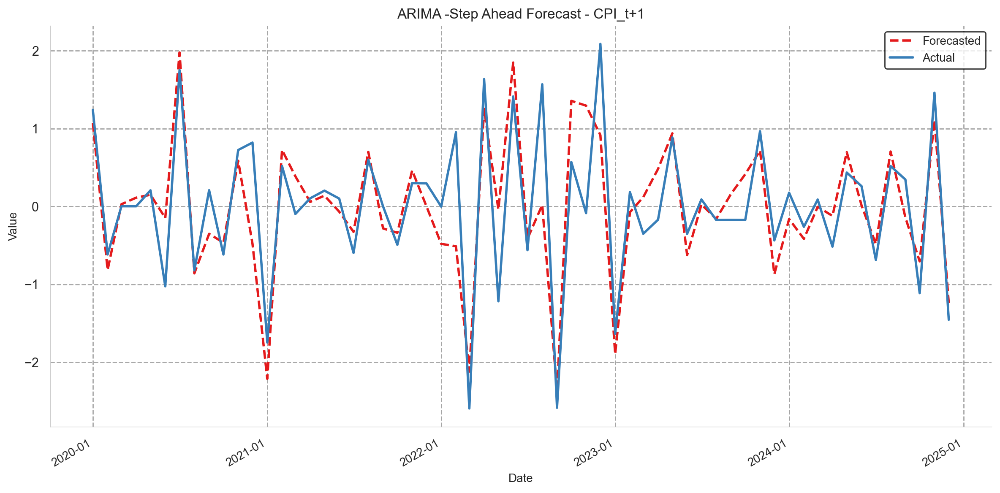

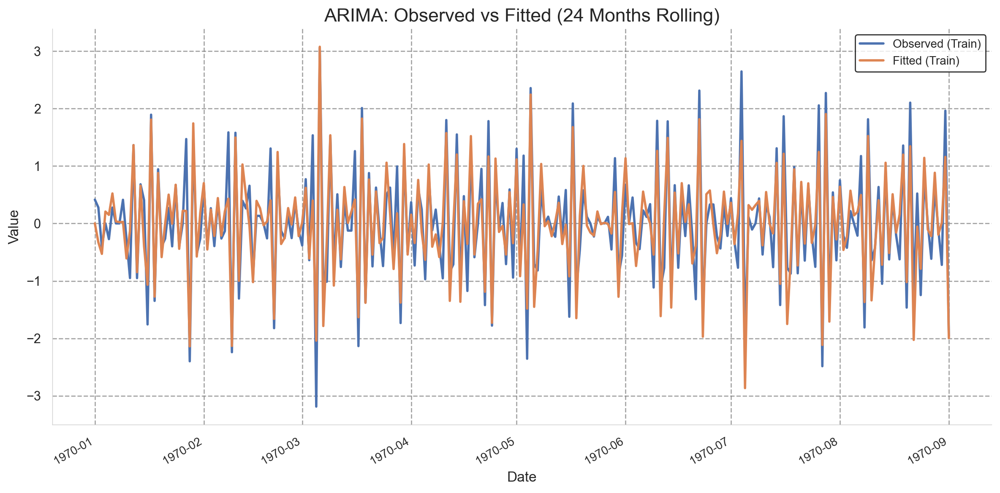

In [26]:
forecast_df, arima_mae, arima_rmse = arima_rm_forecast(train_df, test_df, auto_arima_model_arima, test_size)


# ***SARIMA Training & Test***


In [27]:
train_cpi_sarima = train_df[target]


In [28]:
print(train_df.shape)
print(test_df.shape)


(244, 20)
(60, 20)


In [29]:
# For SARIMA order selection (seasonal):
auto_arima_model_sarima = auto_arima(train_cpi_sarima, seasonal=True, m=12, stepwise=True, # m=12 for monthly seasonality
                                     suppress_warnings=True, error_action="ignore", max_order=10, trace=True,
                                     max_p=10, max_q=10, max_P=10, max_Q=10) # Limit search space


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=144.079, Time=2.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=706.707, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=363.558, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=704.707, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=144.699, Time=2.12 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=154.033, Time=1.56 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=211.134, Time=0.19 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=163.162, Time=1.46 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=142.261, Time=2.18 sec
 ARIMA(2,0,2)(3,0,2)[12] intercept   : AIC=132.348, Time=3.80 sec
 ARIMA(2,0,2)(3,0,1)[12] intercept   : AIC=136.61

In [30]:

def sarima_rm_forecast(train_df, test_df, auto_arima_model_sarima, test_size, target_column=target):

    # Extract CPI series for ARIMA
    train_cpiauscl_arima = train_df[target_column]
    test_cpiauscl_arima = test_df[target_column]

    # Ensure the index is datetime for proper date manipulation
    train_cpiauscl_arima.index = pd.to_datetime(train_cpiauscl_arima.index)
    # Fit SARIMA model to initial training data
    sarima_model = SARIMAX(train_cpiauscl_arima,
                           order=auto_arima_model_sarima.order,
                           seasonal_order=auto_arima_model_sarima.seasonal_order)
    sarima_model_fit = sarima_model.fit(disp=False)  # disp=False to suppress convergence output

    history = train_cpiauscl_arima.tolist()
    predictions = []
    
    for i in range(len(test_cpiauscl_arima)):
        # Forecast the next step
        # Refit the model with the updated training data
        sarima_model = SARIMAX(history,
                               order=auto_arima_model_sarima.order,
                               seasonal_order=auto_arima_model_sarima.seasonal_order,
                               enforce_stationarity=False,
                               enforce_invertibility=False)

        sarima_model_fit = sarima_model.fit(disp=False)
        forecast = sarima_model_fit.forecast(steps=1)
        predictions.append(forecast[0])
        history.append(test_cpiauscl_arima.iloc[i])  # Append actual value

    forecast_df = pd.DataFrame(predictions, index=test_cpiauscl_arima.index, columns=[target_column])

    mae_sarima = mean_absolute_error(test_cpiauscl_arima, forecast_df[target_column])
    rmse_sarima = np.sqrt(mean_squared_error(test_cpiauscl_arima, forecast_df[target_column]))

    # Print evaluation metrics
    print(f'Rolling SARIMA Model - Mean Absolute Error (MAE): {mae_sarima:.4f}')
    print(f'Rolling SARIMA Model - Root Mean Squared Error (RMSE): {rmse_sarima:.4f}')

    # Plot the forecast and the fitted model
    print("DETAILS")
    print(forecast_df.shape)
    print(test_cpiauscl_arima.shape)
    print(sarima_model_fit.fittedvalues.shape)
    sarima_forecast = plot_forecast(forecast_df, test_cpiauscl_arima, title_name='Rolling SARIMA Model Forecast - CPI')
    sarima_fitted = plot_arima_observed_vs_fitted(sarima_model_fit, train_df, title='SARIMA Model - Observed vs Fitted (24 Months Rolling)')
    plt.show()

    return sarima_forecast, mae_sarima, rmse_sarima



# Result

/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Rolling SARIMA Model - Mean Absolute Error (MAE): 0.3738
Rolling SARIMA Model - Root Mean Squared Error (RMSE): 0.5347
DETAILS
(60, 1)
(60,)
(303,)


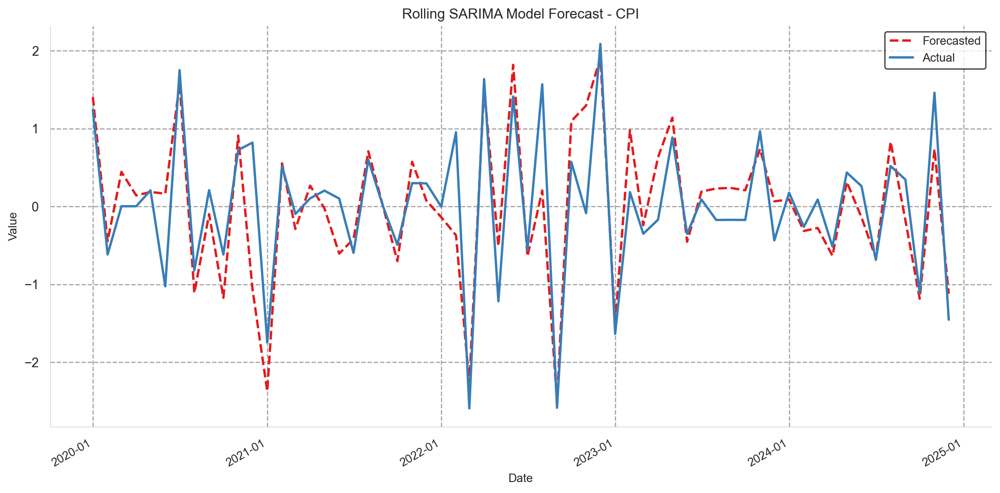

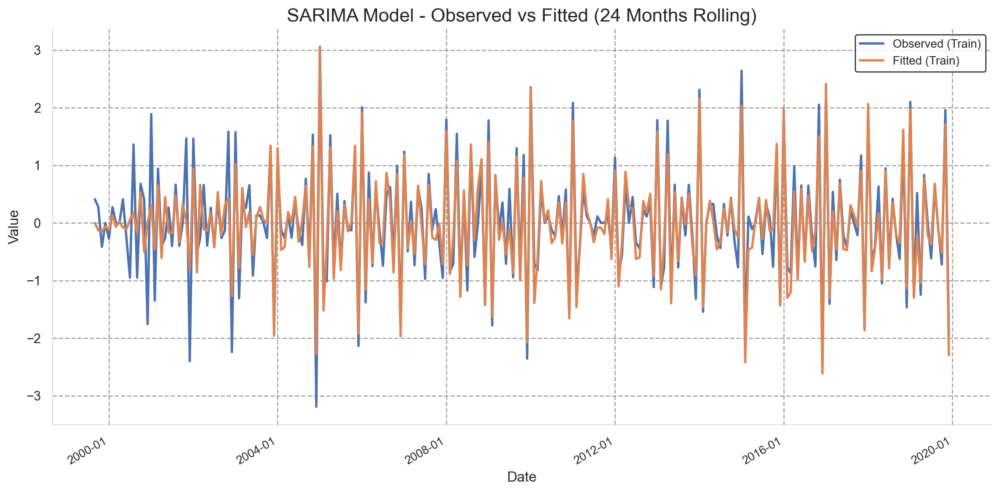

In [31]:

sarima_forecast, sarima_mae, sarima_rmse = sarima_rm_forecast(train_df, test_df, auto_arima_model_sarima, test_size)


# ***CNN-LSTM Training & Testing***

In [9]:
data_l = df_data
#data_l = df_data.copy()


In [10]:
print(df_data.columns)

Index(['GOODFBT', 'ECBIRRO', 'UNERWG', 'IPI', 'LTIR', 'RETAILGSR', 'RETAILXMV',
       'ECBDFR', 'MMR', 'RETAILMV', 'AGRPROD', 'EPI', 'RETAILGF', 'PPIIP',
       'UR', 'WPI', 'ECBMLFR', 'CPI_t+1'],
      dtype='object')


In [152]:

# def prepare_data_for_cnn_lstm(data_l, target_col=target, test_size=test_size):
#     """
#     Prepares and scales data for CNN-LSTM without leakage.
#     """
#     data_x = data_l.copy()
#
#     # Separate target and features
#     y = data_x[[target_col]]
#     X = data_x.drop(target_col, axis=1)
#
#     # Split before scaling
#     X_train = X.iloc[:-test_size]
#     X_test = X.iloc[-test_size:]
#     y_train = y.iloc[:-test_size]
#     y_test = y.iloc[-test_size:]
#
#     # Initialize scalers
#     scaler_X = StandardScaler()
#     scaler_y = StandardScaler()
#
#     # Fit scalers on training data only
#     X_train_scaled = scaler_X.fit_transform(X_train)
#     y_train_scaled = scaler_y.fit_transform(y_train)
#
#     # Transform test data
#     X_test_scaled = scaler_X.transform(X_test)
#     y_test_scaled = scaler_y.transform(y_test)
#
#     # Reconstruct DataFrames (preserving index and column names)
#     X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X.columns, index=X_train.index)
#     y_train_scaled_df = pd.DataFrame(y_train_scaled, columns=y.columns, index=y_train.index)
#     X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X.columns, index=X_test.index)
#     y_test_scaled_df = pd.DataFrame(y_test_scaled, columns=y.columns, index=y_test.index)
#
#     # Combine scaled features and target
#     train_scaled = pd.concat([X_train_scaled_df, y_train_scaled_df], axis=1)
#     test_scaled = pd.concat([X_test_scaled_df, y_test_scaled_df], axis=1)
#
#     return train_scaled, test_scaled, scaler_X, scaler_y

# train_data, test_data, scaler_X, scaler_y = prepare_data_for_cnn_lstm(df_data, target, test_size=test_size)
# data_l = pd.concat([train_data, test_data])  # If needed for time-series index continuity

# data_ls = prepare_data_for_cnn_lstm(data_l, 'CPI')
# print(data_l.shape)
# print(data.shape)


(304, 18)
(304, 115)


In [11]:

def plot_predictions(y_actual, y_pred, train_index, title='CNN-LSTM: Actual vs Forecasted Values'):
    """Plots actual vs forecasted values."""
    train_index = pd.to_datetime(train_index)
    fig = plt.figure(figsize=(12, 6))
    plt.plot(train_index, y_actual, label='Actual', color='blue', linestyle='solid')
    plt.plot(train_index, y_pred, label='Forecasted', color='red', linestyle='dashed')

    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(title, fontsize=10)
    plt.legend()
    plt.grid(True)
    plt.show()
    return fig

def plot_loss(history):
    # Plots loss function
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('LSTM - Loss (MSE)')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper right')
    plt.show()
    plt.close()

def plot_observed_vs_fitted(y_train, predictions_train, train_index):
    fig = plt.figure(figsize=(12, 6))
    train_index = pd.to_datetime(train_index)
    plt.plot(train_index, y_train, label="Observed (Train)", linestyle="solid")
    plt.plot(train_index, predictions_train, label="Fitted (Train)", linestyle="solid")
    plt.title("CNN-LSTM - Observed vs. Fitted Values")

    ax = plt.gca()
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    formatter = mdates.DateFormatter('%Y-%m')
    ax.xaxis.set_major_formatter(formatter)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.gcf().autofmt_xdate()

    plt.tight_layout()
    plt.xlabel("Time Steps")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()
    return fig


In [101]:
def prepare_data(data, target_column, test_size):
    """
    Splits the data into training and testing sets and reshapes it for ConvLSTM2D.

    Parameters:
    - data (DataFrame): The input dataset.
    - target_column (str): The column name of the target variable.
    - test_size (int): Number of test samples.

    Returns:
    - X_train, y_train, X_test, y_test: Training and testing datasets, reshaped for ConvLSTM2D.
    """
    data_x = data.copy()

    train_df = data_x.iloc[:-test_size]
    test_df = data_x.iloc[-test_size:]
    train_index = train_df.index
    test_index = test_df.index

    X_train = train_df.drop(target_column, axis=1).values
    y_train = train_df[target_column].values.reshape(-1, 1)
    X_test = test_df.drop(target_column, axis=1).values
    y_test = test_df[target_column].values.reshape(-1, 1)

    # Initialize scalers
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()

    # Fit scalers on training data only
    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train)

    # Transform test data
    X_test_scaled = scaler_X.transform(X_test)
    y_test_scaled = scaler_y.transform(y_test)

    # Reshape for ConvLSTM2D: [samples, timesteps, rows, cols, channels]
    X_train = X_train_scaled.reshape((X_train_scaled.shape[0], 1, 1, 1, X_train_scaled.shape[1]))
    X_test = X_test_scaled.reshape((X_test_scaled.shape[0], 1, 1, 1, X_test_scaled.shape[1]))

    return X_train, y_train_scaled, X_test, y_test_scaled, train_index, test_index, scaler_y

# def prepare_data_2(data, target_column, test_size, timesteps=24):
#     """
#     Prepares data with sequential timesteps for ConvLSTM2D input.
#
#     Parameters:
#     - data (DataFrame): Full dataset including target column.
#     - target_column (str): Name of the target variable.
#     - test_size (int): Number of test samples.
#     - timesteps (int): Number of time steps in each sequence.
#
#     Returns:
#     - X_train, y_train, X_test, y_test, train_index, test_index, scaler_y
#     """
#     data_x = data.copy()
#
#     # Split
#     train_df = data_x.iloc[:-test_size]
#     test_df = data_x.iloc[-(test_size + timesteps):]  # include extra for creating full sequences
#     train_index = train_df.index[timesteps:]
#     test_index = test_df.index[timesteps:]
#
#     # Scale features
#     scaler_X = MinMaxScaler()
#     scaler_y = MinMaxScaler()
#     X_train_raw = train_df.drop(target_column, axis=1).values
#     y_train_raw = train_df[target_column].values.reshape(-1, 1)
#
#     X_train_scaled = scaler_X.fit_transform(X_train_raw)
#     y_train_scaled = scaler_y.fit_transform(y_train_raw)
#
#     X_test_raw = test_df.drop(target_column, axis=1).values
#     y_test_raw = test_df[target_column].values.reshape(-1, 1)
#
#     X_test_scaled = scaler_X.transform(X_test_raw)
#     y_test_scaled = scaler_y.transform(y_test_raw)
#
#     # Create sequences
#     def create_sequences(X, y, timesteps):
#         X_seq, y_seq = [], []
#         for i in range(timesteps, len(X)):
#             X_seq.append(X[i - timesteps:i])
#             y_seq.append(y[i])
#         return np.array(X_seq), np.array(y_seq)
#
#     X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, timesteps)
#     X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, timesteps)
#
#     # Reshape for ConvLSTM2D: (samples, timesteps, rows=1, cols=1, channels=n_features)
#     n_features = X_train_seq.shape[2]
#     X_train_seq = X_train_seq.reshape((X_train_seq.shape[0], timesteps, 1, 1, n_features))
#     X_test_seq = X_test_seq.reshape((X_test_seq.shape[0], timesteps, 1, 1, n_features))
#
#     return X_train_seq, y_train_seq, X_test_seq, y_test_seq, train_index, test_index, scaler_y



In [506]:
X_train, y_train, X_test, y_test, train_index, test_index, scaler_y = prepare_data(df_data, target, test_size=test_size)

In [480]:

# print(timesteps, rows, cols, channels)

12 1 1 17


In [239]:
print(y_test[:3])

[[0.70854089]
 [0.41129242]
 [0.51047387]]


In [106]:

# def prepare_data(data, target_column, test_size):
#     """
#     Splits the data into training and testing sets and reshapes it for ConvLSTM2D.
#
#     Parameters:
#     - data (DataFrame): The input dataset.
#     - target_column (str): The column name of the target variable.
#     - test_size (int or float): Number of test samples (if int) or percentage of data for testing (if float).
#     - test_size_percent (bool): If True, interprets test_size as a percentage (0-1).
#
#     Returns:
#     - X_train, y_train, X_test, y_test: Training and testing datasets, reshaped for ConvLSTM2D.
#     """
#
#     train_df = data.iloc[:-test_size]
#     test_df = data.iloc[-test_size:]
#     train_index = train_df.index
#     test_index = test_df.index
#
#     X_train = train_df.drop(target_column, axis=1).values
#     y_train = train_df[target_column].values
#     X_test = test_df.drop(target_column, axis=1).values
#     y_test = test_df[target_column].values
#
#     X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
#     X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))
#
#     return X_train, y_train, X_test, y_test, train_index, test_index


# BEST SO FAR
def build_model(input_shape):
    """Builds and compiles a ConvLSTM2D model."""
    model = Sequential([
        ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='tanh', return_sequences=True, input_shape=input_shape, kernel_regularizer=l2(0.002)),
        ConvLSTM2D(filters=8, kernel_size=(1, 1), activation='tanh', return_sequences=False, kernel_regularizer=l2(0.002)),
        Dropout(0.6),
        Flatten(),
        Dense(1)
    ])
    opt = Adam(learning_rate=0.0007)
    model.compile(optimizer=opt, loss='mse')
    return model

def train_model(model, X_train, y_train):
    """Trains the model with early stopping."""
    early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=600, batch_size=16, shuffle=False, validation_split=0.2, callbacks=[early_stopping])
    return history

def evaluate_model(model, X_test, y_test):
    """Evaluates the model and returns the test loss and predictions."""
    loss = model.evaluate(X_test, y_test, verbose=0)
    predictions = model.predict(X_test, verbose=0)
    return loss, predictions

def inverse_transform(scaler, data):
    """Inverse transforms the scaled data."""
    return scaler.inverse_transform(data.reshape(-1, 1))

def cnn_lstm_model(data, test_size=test_size):
    """Main function to execute the pipeline."""
    X_train, y_train, X_test, y_test, train_index, test_index, scaler_y = prepare_data(data, target, test_size=test_size)
    # timesteps = X_train.shape[1]
    # rows = X_train.shape[2]
    # cols = X_train.shape[3]
    # channels = X_train.shape[4]
    # model = build_model((timesteps, rows, cols, channels))
    model = build_model((X_train.shape[0], 1, 1, X_train.shape[-1]))
    history = train_model(model, X_train, y_train)

    loss, predictions = evaluate_model(model, X_test, y_test)
    # print(f'Test Loss: {loss}')
    
    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
    plot_cnn_forecast = plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_loss(history)

    predictions_train = model.predict(X_train, verbose=0) # Predict on X_train
    predictions_train_actual = inverse_transform(scaler_y, predictions_train) # Inverse transform fitted values
    y_train_actual = inverse_transform(scaler_y, y_train) # Inverse transform y_train

    # --- Plot Observed vs Fitted on Training Data ---
    plot_cnn_obs_vs_fitted = plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index) # Pass y_train_actual and predictions_train_actual
    # plot_observed_vs_fitted(y_train, predictions)

    print(f'Mean Absolute Error (MAE): {mae:.8f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')
    return model, X_train, X_test, mae, rmse

def cnn_lstm_model_recursive(data, test_size=60):
    """CNN-LSTM with recursive forecasting on the test set."""
    X_train, y_train, X_test, y_test, train_index, test_index, scaler_y = prepare_data(data, target, test_size=test_size, timesteps=timesteps)

    # Build model using proper input shape
    input_shape = ((X_train.shape[0], 1, 1, X_train.shape[-1]))
    model = build_model(input_shape)

    history = train_model(model, X_train, y_train)

    # === Recursive Forecasting ===
    y_pred_recursive = []
    current_input = X_test[0]  # shape: (timesteps, 1, 1, n_features)

    for i in range(len(y_test)):
        # Predict one step ahead
        current_input_reshaped = np.expand_dims(current_input, axis=0)  # (1, timesteps, 1, 1, n_features)
        next_pred = model.predict(current_input_reshaped, verbose=0)[0]  # shape: (1,)
        y_pred_recursive.append(next_pred)

        # Prepare input for next step
        if i + 1 < len(X_test):
            next_input = current_input[1:].copy()  # drop the first time step
            next_input = np.concatenate([next_input, X_test[i][[-1]]], axis=0)  # add the most recent input (or you could add predicted value)
            current_input = next_input  # update for next iteration

    y_pred_recursive = np.array(y_pred_recursive)
    y_test_actual = inverse_transform(scaler_y, y_test)
    y_pred_actual = inverse_transform(scaler_y, y_pred_recursive)

    # === Metrics & Visualization ===
    mae = mean_absolute_error(y_test_actual, y_pred_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, y_pred_actual))
    plot_cnn_forecast = plot_predictions(y_test_actual, y_pred_actual, test_index)
    plot_loss(history)

    # === Fitted values on training set ===
    predictions_train = model.predict(X_train, verbose=0)
    predictions_train_actual = inverse_transform(scaler_y, predictions_train)
    y_train_actual = inverse_transform(scaler_y, y_train)
    plot_cnn_obs_vs_fitted = plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index)

    print(f'Mean Absolute Error (MAE): {mae:.8f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')

    return model, X_train, X_test, mae, rmse

def add_time_features(df):
    df = df.copy()

    # Convert index to datetime if it's not already
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.to_datetime(df.index)

    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    df['year'] = df.index.year

    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
    df['quarter_sin'] = np.sin(2 * np.pi * df['quarter'] / 4)
    df['quarter_cos'] = np.cos(2 * np.pi * df['quarter'] / 4)
    return df.drop(columns=['month', 'quarter', 'year'])


# Call
# main(data_ls, scaler_y)
# data_x = data_ls.copy().drop(columns="dfCPI_L1")


In [621]:
# data_m
# df_data
# df_t = add_time_features(data_m)

# data_acf_pacf
# data_m = data[main_vars]
df_datax = data_acf_pacf.drop(columns=["CPI", "HICP"])

Epoch 1/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.3742 - val_loss: 0.3493
Epoch 2/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3362 - val_loss: 0.3107
Epoch 3/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2987 - val_loss: 0.2717
Epoch 4/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2618 - val_loss: 0.2330
Epoch 5/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2172 - val_loss: 0.1967
Epoch 6/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1958 - val_loss: 0.1648
Epoch 7/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1723 - val_loss: 0.1412
Epoch 8/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1650 - val_loss: 0.1267
Epoch 9/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1449 - val_loss: 0.1187
Epoch 10/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1326 - val_loss: 0.1127
Epoch 11/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1247 - val_loss: 0.1091
Epoch 12/600
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0

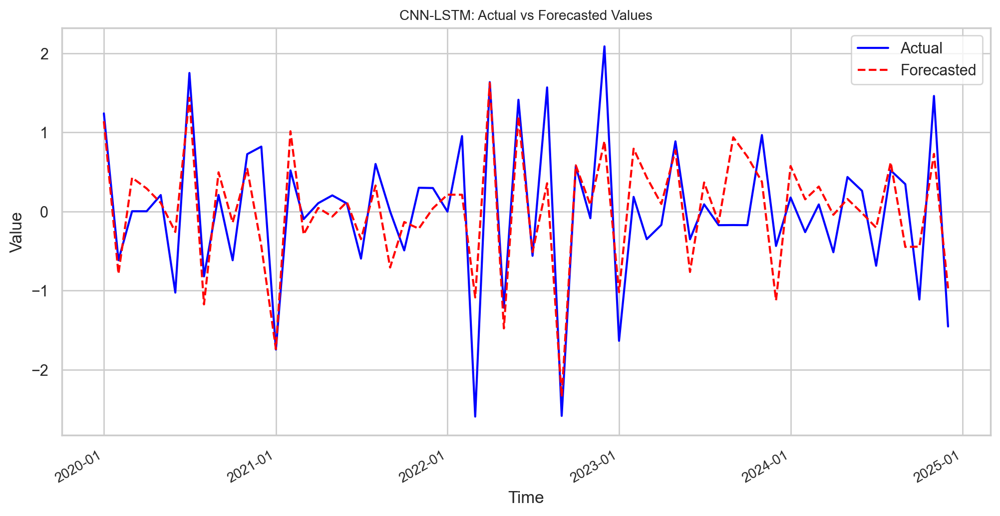

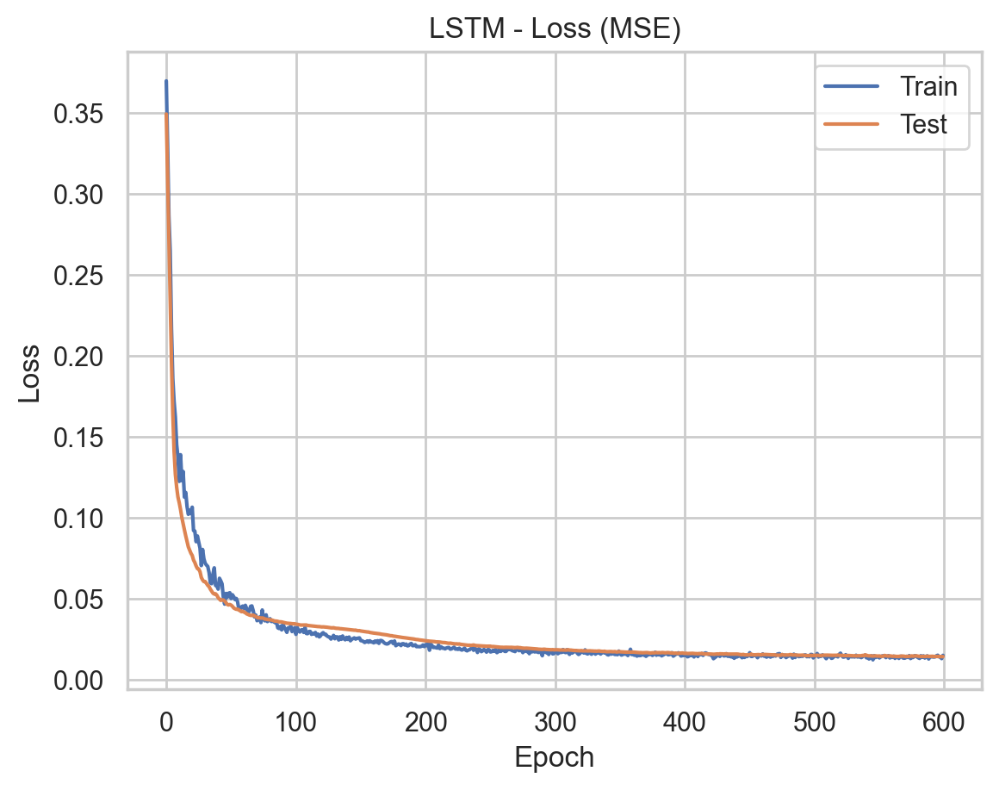

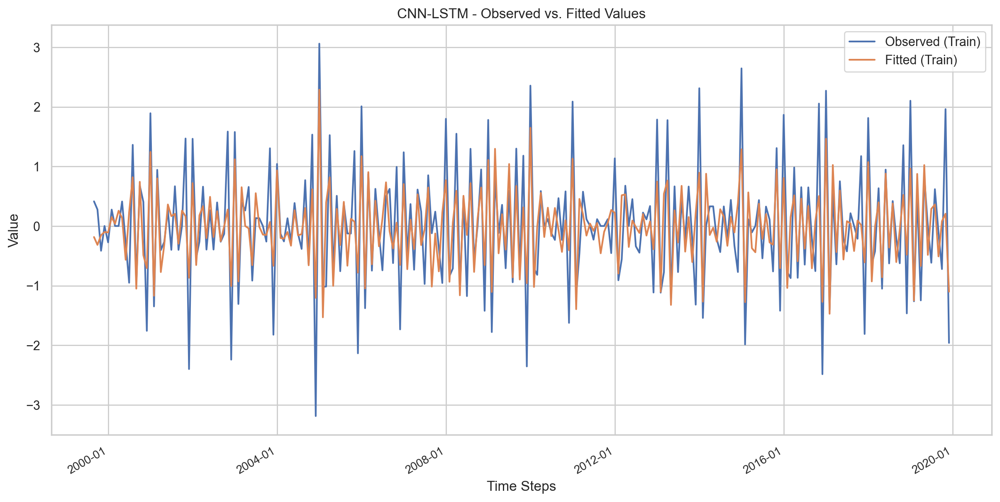

Mean Absolute Error (MAE): 0.42740051
Root Mean Squared Error (RMSE): 0.54511915


In [108]:
model, X_train, X_test, cnn_mae, cnn_rmse = cnn_lstm_model(data_m, test_size)

# All Results for one sample run

In [368]:
print(f'CNN-LSTM (MAE): {cnn_mae}')
print(f'CNN-LSTM (RMSE): {cnn_rmse}')
print(f'VAR (MAE): {var_mae}')
print(f'VAR (RMSE): {var_rmse}')
print(f'ARIMA (MAE): {arima_mae}')
print(f'ARIMA (RMSE): {arima_rmse}')
print(f'SARIMA (MAE): {sarima_mae}')
print(f'SARIMA (RMSE): {sarima_rmse}')



CNN-LSTM (MAE): 0.4303936393482117
CNN-LSTM (RMSE): 0.5387115416763173
VAR (MAE): 0.5186885952892484
VAR (RMSE): 0.6578583538617034
ARIMA (MAE): 0.38651970184750273
ARIMA (RMSE): 0.5339247023258886
SARIMA (MAE): 0.3738163446142867
SARIMA (RMSE): 0.5347173600312268


# NEW CNN-LSTM Model

In [28]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D
# print(data_x.index)



In [458]:
def inverse_transform_1(scaler, data):
    if isinstance(data, str):
        raise ValueError(f"Expected array-like, but got string: {data}")
    return scaler.inverse_transform(np.array(data).reshape(-1, 1))

def prepare_data_1(data_df, target_column, test_size, look_back=12, test_size_percent=False):
    if test_size_percent:
        test_size = int(len(data_df) * test_size)

    y = data_df[[target_column]]
    X = data_df.drop(columns=[target_column])

    features = X.values
    target = y.values

    X_seq, y_seq, indices = [], [], []
    for i in range(look_back, len(data_df)):
        window = features[i - look_back:i]
        X_seq.append(window)
        y_seq.append(target[i])
        indices.append(data_df.index[i])

    X_seq = np.array(X_seq)
    y_seq = np.array(y_seq)
    indices = np.array(indices)

    split_index = len(X_seq) - test_size

    X_train = X_seq[:split_index]
    y_train = y_seq[:split_index]
    X_test = X_seq[split_index:]
    y_test = y_seq[split_index:]
    train_index = indices[:split_index]
    test_index = indices[split_index:]

    # Prepare ConvLSTM-friendly input (2D reshaping into image form)
    num_features = X_train.shape[2]
    grid_size = math.ceil(math.sqrt(num_features))
    rows, cols = grid_size, grid_size
    assert rows * cols >= num_features, f"{rows}x{cols} grid too small for {num_features} features"

    def pad_and_reshape(X):
        padded = np.zeros((X.shape[0], X.shape[1], rows, cols))
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
                flat = X[i, j]
                padded_flat = np.zeros(rows * cols)
                padded_flat[:num_features] = flat
                padded[i, j] = padded_flat.reshape((rows, cols))
        return padded[..., np.newaxis]

    X_train_final = pad_and_reshape(X_train)
    X_test_final = pad_and_reshape(X_test)

    return X_train_final, y_train, X_test_final, y_test, test_index, train_index


def train_model_1(model, X_train, y_train):
    early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True)
    history = model.fit(
        X_train, y_train,
        epochs=600,
        batch_size=24,
        validation_split=0.2,
        shuffle=False,
        callbacks=[early_stopping]
    )
    return history


def evaluate_model_1(model, X_test, y_test):
    loss = model.evaluate(X_test, y_test, verbose=0)
    predictions = model.predict(X_test, verbose=0)
    return loss, predictions


def build_model_1(input_shape):
    model = Sequential([
        # Bidirectional(ConvLSTM2D(filters=128, kernel_size=(2, 2), activation='tanh', return_sequences=True, input_shape=input_shape)),
        # Bidirectional(ConvLSTM2D(filters=64, kernel_size=(2, 2), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=16, kernel_size=(2, 2), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=8, kernel_size=(2, 2), activation='tanh')),
        Flatten(),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    
    return model
# def build_model_1(input_shape):
#     model = Sequential([
#         Bidirectional(ConvLSTM2D(filters=128, kernel_size=(1, 1), activation='tanh', return_sequences=True, input_shape=input_shape)),
#         Bidirectional(ConvLSTM2D(filters=128, kernel_size=(1, 1), activation='tanh', return_sequences=True)),
#         Bidirectional(ConvLSTM2D(filters=64, kernel_size=(1, 1), activation='tanh', return_sequences=True)),
#         Bidirectional(ConvLSTM2D(filters=64, kernel_size=(1, 1), activation='tanh', return_sequences=True)),
#         Bidirectional(ConvLSTM2D(filters=48, kernel_size=(1, 1), activation='tanh', return_sequences=True)),
#         Bidirectional(ConvLSTM2D(filters=48, kernel_size=(1, 1), activation='tanh', return_sequences=True)),
#         Bidirectional(ConvLSTM2D(filters=24, kernel_size=(1, 1), activation='tanh', return_sequences=True)),
#         Bidirectional(ConvLSTM2D(filters=12, kernel_size=(1, 1), activation='tanh')),
#         Flatten(),
#         Dense(1)
#     ])
#     model.compile(optimizer=Adam(0.001), loss='mse')
#     return model

# def cnn_lstm_model_1(data, target_column, test_size, look_back=12, scaler_y=None):
# 
#     # Initial preparation
#     X_train, y_train, X_test_full, y_test_full, test_index, train_index = prepare_data_1(
#         data, target_column, test_size, look_back
#     )
# 
#     predictions = []
#     y_test_actual = []
#     X_train_current = deepcopy(X_train)
#     y_train_current = deepcopy(y_train)
# 
#     for i in range(len(X_test_full)):
#         # Build and train a new model on the current training set
#         model = build_model_1(X_train_current.shape[1:])
#         history = train_model_1(model, X_train_current, y_train_current)
# 
#         # Predict the next test point
#         X_test_current = X_test_full[i:i+1]
#         y_test_true = y_test_full[i:i+1]
# 
#         pred = model.predict(X_test_current, verbose=0).flatten()[0]
#         predictions.append(pred)
#         y_test_actual.append(y_test_true[0])
# 
#         # Add the true test point to training set
#         X_train_current = np.concatenate([X_train_current, X_test_current], axis=0)
#         y_train_current = np.append(y_train_current, y_test_true)
# 
#     predictions = np.array(predictions)
#     y_test_actual = np.array(y_test_actual)
# 
#     # Inverse transform if scaler provided
#     if scaler_y is not None:
#         y_test_actual = inverse_transform_1(scaler_y, y_test_actual)
#         predictions = inverse_transform_1(scaler_y, predictions)
#         predictions_train = model.predict(X_train, verbose=0)
#         predictions_train_actual = inverse_transform_1(scaler_y, predictions_train)
#         y_train_actual = inverse_transform_1(scaler_y, y_train)
#     else:
#         predictions_train_actual = model.predict(X_train, verbose=0)
#         y_train_actual = y_train
# 
#     # Evaluation
#     mae = mean_absolute_error(y_test_actual, predictions)
#     rmse = np.sqrt(mean_squared_error(y_test_actual, predictions))
# 
#     # Plots
#     plot_loss(history)
#     plot_predictions(y_test_actual, predictions, test_index)
#     plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index)
# 
#     print(f'Mean Absolute Error (MAE): {mae:.8f}')
#     print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')
# 
#     return predictions, y_test_actual
# # 

def cnn_lstm_model_1(data, target_column, test_size, look_back=12, scaler_y=None):
    X_train, y_train, X_test, y_test, test_index, train_index = prepare_data_1(data, target_column, test_size, look_back)

    model = build_model_1(X_train.shape[1:])
    history = train_model_1(model, X_train, y_train)

    # loss, predictions = evaluate_model_1(model, X_test, y_test)
    # Store actuals and predictions
    predictions = []
    y_test_actual = []

    current_X = X_train.copy()
    current_y = y_train.copy()

    for i in range(X_test.shape[0]):
        # Predict the next value
        next_pred = model.predict(current_X[-1].reshape(1, *X_train.shape[1:]), verbose=0)[0][0]

        # Store prediction and ground truth
        predictions.append(next_pred)
        y_test_actual.append(y_test[i])

        # Prepare the next input
        new_input = X_test[i].copy()

        # Replace the target in new_input with predicted value (only needed if it's in features — optional)
        # You can skip this step unless your model uses previous y in X

        # Append the new input and predicted target to training set
        current_X = np.append(current_X, new_input.reshape(1, *X_train.shape[1:]), axis=0)
        current_y = np.append(current_y, next_pred)

    predictions = np.array(predictions)
    y_test_actual = np.array(y_test_actual)

    if scaler_y is not None:
        y_test_actual = inverse_transform_1(scaler_y, y_test_actual)
        predictions_actual = inverse_transform_1(scaler_y, predictions)
        predictions_train = model.predict(X_train, verbose=0)
        predictions_train_actual = inverse_transform_1(scaler_y, predictions_train)
        y_train_actual = inverse_transform_1(scaler_y, y_train)
    else:
        # y_test_actual = y_test
        predictions_actual = predictions
        predictions_train_actual = model.predict(X_train, verbose=0)
        y_train_actual = y_train

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    plot_loss(history)
    plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index)

    print(f'Mean Absolute Error (MAE): {mae:.8f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')

    return model, X_train, X_test, mae, rmse



# Re-define the updated pipeline with temporal features and ConvLSTM2D
def inverse_transform_1(scaler, data):
    if isinstance(data, str):
        raise ValueError(f"Expected array-like, but got string: {data}")
    return scaler.inverse_transform(np.array(data).reshape(-1, 1))

# def add_time_features(df):
#     df['month'] = df.index.month
#     df['quarter'] = df.index.quarter
#     df['year'] = df.index.year
#     df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
#     df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
#     return df.drop(columns=['month', 'quarter', 'year'])
def add_time_features(df):
    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    df['year'] = df.index.year

    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
    df['quarter_sin'] = np.sin(2 * np.pi * df['quarter'] / 4)
    df['quarter_cos'] = np.cos(2 * np.pi * df['quarter'] / 4)

    return df.drop(columns=['month', 'quarter', 'year'])  # drop only if you keep cyclical encodings


def prepare_data_1(data_df, target_column, test_size, look_back=12, test_size_percent=False):
    if test_size_percent:
        test_size = int(len(data_df) * test_size)

    y = data_df[[target_column]]
    X = data_df.drop(target_column, axis=1)

    features = X.values
    target = y.values

    X_seq, y_seq, indices = [], [], []
    for i in range(look_back, len(data_df)):
        window = features[i - look_back:i]
        X_seq.append(window)
        y_seq.append(target[i])
        indices.append(data_df.index[i])

    X_seq = np.array(X_seq)  # Shape: (samples, timesteps, features)
    y_seq = np.array(y_seq)  # Shape: (samples, 1)
    indices = np.array(indices)

    split_index = len(X_seq) - test_size

    # Split before scaling
    X_train = X_seq[:split_index]
    y_train = y_seq[:split_index]
    X_test = X_seq[split_index:]
    y_test = y_seq[split_index:]
    train_index = indices[:split_index]
    test_index = indices[split_index:]

    # Scale features
    num_features = X_train.shape[2]
    scaler_X = StandardScaler()
    scaler_y1 = StandardScaler()

    # Flatten X to 2D for scaling, then reshape back
    X_train_flat = X_train.reshape(-1, num_features)
    X_train_scaled_flat = scaler_X.fit_transform(X_train_flat)
    X_train_scaled = X_train_scaled_flat.reshape(X_train.shape)

    X_test_flat = X_test.reshape(-1, num_features)
    X_test_scaled_flat = scaler_X.transform(X_test_flat)
    X_test_scaled = X_test_scaled_flat.reshape(X_test.shape)

    # Scale y
    y_train_scaled = scaler_y1.fit_transform(y_train)
    y_test_scaled = scaler_y1.transform(y_test)

    # Image-shaped padding for ConvLSTM
    # rows, cols = 3, 6
    num_features = X_train.shape[2]
    grid_size = math.ceil(math.sqrt(num_features))
    rows, cols = grid_size, grid_size
    assert rows * cols >= num_features, f"{rows}x{cols} grid too small for {num_features} features"

    def pad_and_reshape(X):
        padded = np.zeros((X.shape[0], X.shape[1], rows, cols))
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
                flat = X[i, j]
                padded_flat = np.zeros(rows * cols)
                padded_flat[:num_features] = flat
                padded[i, j] = padded_flat.reshape((rows, cols))
        return padded[..., np.newaxis]  # add channel dim

    X_train_final = pad_and_reshape(X_train_scaled)
    X_test_final = pad_and_reshape(X_test_scaled)

    return X_train_final, y_train_scaled, X_test_final, y_test_scaled, test_index, train_index, scaler_y1

def train_model_1(model, X_train, y_train):
    early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True)
    history = model.fit(
        X_train, y_train,
        epochs=600,
        batch_size=48,
        validation_split=0.2,
        shuffle=False,
        callbacks=[early_stopping]
    )
    return history

def evaluate_model_1(model, X_test, y_test):
    loss = model.evaluate(X_test, y_test, verbose=0)
    predictions = model.predict(X_test, verbose=0)
    return loss, predictions

def build_model_1(input_shape):
    model = Sequential([
        Bidirectional(ConvLSTM2D(filters=8, kernel_size=(2, 2), activation='tanh', return_sequences=True, input_shape=input_shape)),
        # Dropout(0.2),
        Bidirectional(ConvLSTM2D(filters=8, kernel_size=(2, 2), activation='tanh')),
        Flatten(),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def cnn_lstm_model_1(data, test_size, look_back=12):
    X_train, y_train, X_test, y_test, test_index, train_index, scaler_y1 = prepare_data_1(data, target, test_size=test_size, look_back=look_back)
    model = build_model_1(X_train.shape[1:])
    history = train_model_1(model, X_train, y_train)

    loss, predictions = evaluate_model_1(model, X_test, y_test)
    # print(f'Test Loss: {loss}')
    # print(f'Type of predictions: {type(predictions)}')

    y_test_actual = inverse_transform_1(scaler_y1, y_test)
    predictions_actual = inverse_transform_1(scaler_y1, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    predictions_train = model.predict(X_train, verbose=0)
    predictions_train_actual = inverse_transform_1(scaler_y1, predictions_train)
    y_train_actual = inverse_transform_1(scaler_y1, y_train)

    plot_loss(history)
    plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index)

    print(f'Mean Absolute Error (MAE): {mae:.8f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.8f}')

    return model, X_train, X_test, mae, rmse



In [58]:
# data_x = add_time_features(data_l)
data_x = df_data

Epoch 1/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 1.1523 - val_loss: 1.3057
Epoch 2/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 1.1041 - val_loss: 1.2582
Epoch 3/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 1.0526 - val_loss: 1.1792
Epoch 4/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step - loss: 0.9684 - val_loss: 1.0272
Epoch 5/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.8239 - val_loss: 0.7860
Epoch 6/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.6340 - val_loss: 0.6240
Epoch 7/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.4999 - val_loss: 0.6029
Epoch 8/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.4135 - val_loss: 0.6235
Epoch 9/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.3646 - val_loss: 0.6215
Epoch 10/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.3179 - val_loss: 0.6386
Epoch 11/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.2880 - val_loss: 0.6387
Epoch 12/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.24

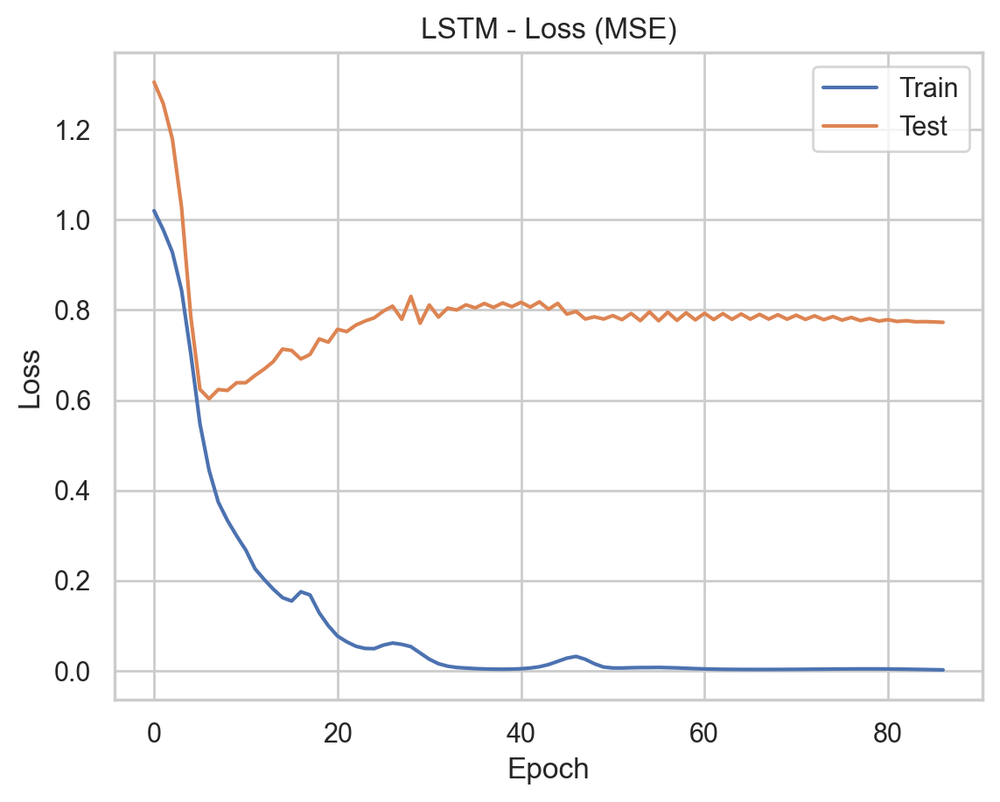

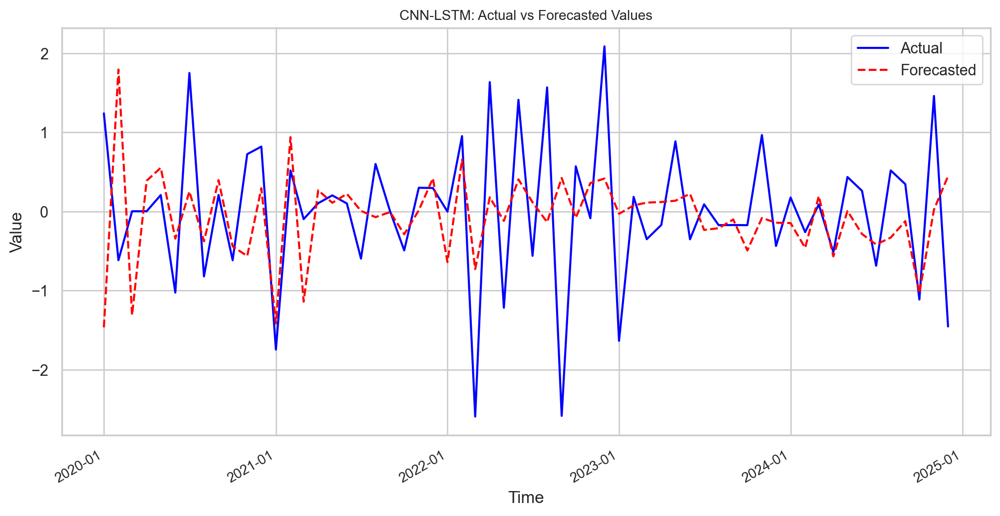

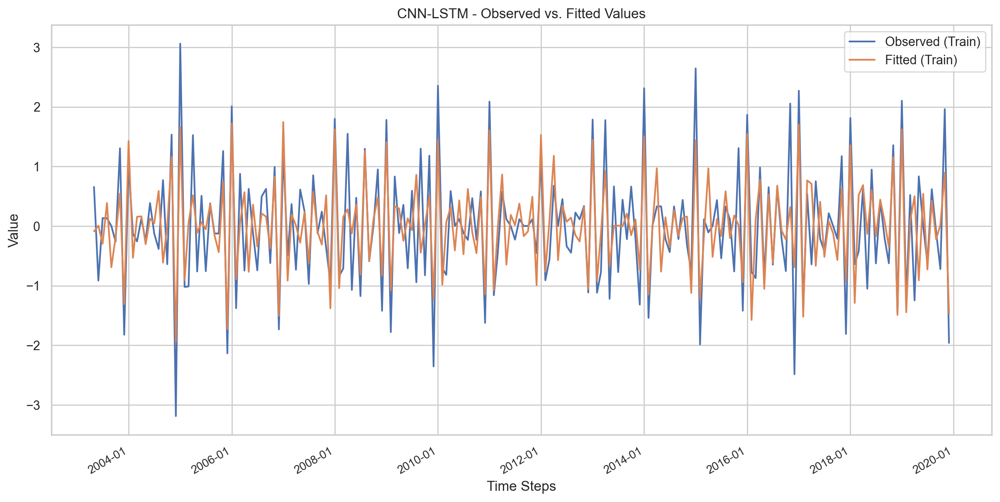

Mean Absolute Error (MAE): 0.71822419
Root Mean Squared Error (RMSE): 0.99223700


In [625]:
model, X_train, X_test, cnn_mae, cnn_rmse = cnn_lstm_model_1(df_datax, target, test_size=test_size, look_back=12)


# SHAP Value Estimation for CNN-LSTM Model

In [42]:
print(data_x.columns)


Index(['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
       'RETAILXMV', 'RETAILGSR', 'RETAILGF', 'GOODFBT', 'AGRPROD', 'PPIIP',
       'WPI', 'EPI', 'IPI', 'LTIR', 'UR', 'dfHICP_L1', 'month_sin',
       'month_cos', 'quarter_sin', 'quarter_cos'],
      dtype='object')


In [626]:

# Wrapper function for SHAP
def model_predict(X):
    """Predict function for SHAP that ensures correct input shape."""
    X = X.reshape((X.shape[0], 1, 1, 1, X.shape[1]))  # Reshape to original model input shape
    return model.predict(X, verbose=0).flatten()  # Flatten output for SHAP

# Select a subset of X_test for SHAP analysis
feature_names = df_datax.drop(columns=[target]).columns.tolist()
num_samples = min(50, X_test.shape[0])  # Ensure we don't exceed the available samples

X_sample = X_test[:num_samples].reshape((num_samples, X_test.shape[-1]))  # Convert to 2D
X_sample_df = pd.DataFrame(X_sample, columns=feature_names)  # Convert NumPy array back to DataFrame

# Create Kernel SHAP Explainer
explainer = shap.KernelExplainer(model_predict, X_sample_df)

# Compute SHAP values
shap_values = explainer.shap_values(X_sample_df)

# Create SHAP summary plot
fig, ax = plt.subplots(figsize=(10, 6))  # Adjust figure size if needed
shap.summary_plot(shap_values, X_sample_df, show=False)  # Prevent immediate display

# Adjust font sizes
for item in ax.get_xticklabels() + ax.get_yticklabels():
    item.set_fontsize(8)  # Change this value to your desired font size

plt.show()

# Plot summary plot
# shap.summary_plot(shap_values, X_sample_df)


ValueError: cannot reshape array of size 86400 into shape (50,1)

# ***Top Influential Variables***

In [83]:

# Compute mean absolute SHAP values for each feature
shap_importance = np.abs(shap_values).mean(axis=0)

# Create a dictionary mapping feature names to their importance
shap_importance_dict = dict(zip(feature_names, shap_importance))

# Sort features by importance (descending order)
sorted_features = sorted(shap_importance_dict, key=shap_importance_dict.get, reverse=True)



In [84]:
# Convert the dictionary to a list of (feature, importance) tuples
shap_importance_list = list(shap_importance_dict.items())

# Sort the list in descending order based on the importance value (second element of the tuple)
shap_importance_list.sort(key=lambda item: item[1], reverse=True)

# Print the sorted feature names and their importance values
print("SHAP Feature Importance (Descending Order):")
for feature, importance in shap_importance_list:
    print(f"{feature}: {importance:.4f}") # You can adjust the formatting of the importance value

SHAP Feature Importance (Descending Order):
RETAILXMV: 0.0752
RETAILMV: 0.0400
LTIR: 0.0383
CPI: 0.0306
IPI: 0.0282
EPI: 0.0266
PPIIP: 0.0178
AGRPROD: 0.0167
MMR: 0.0108
RETAILGF: 0.0085
GOODFBT: 0.0077
RETAILGSR: 0.0062
UNERWG: 0.0058
WPI: 0.0047
UR: 0.0047
ECBIRRO: 0.0000
ECBDFR: 0.0000
ECBMLFR: 0.0000


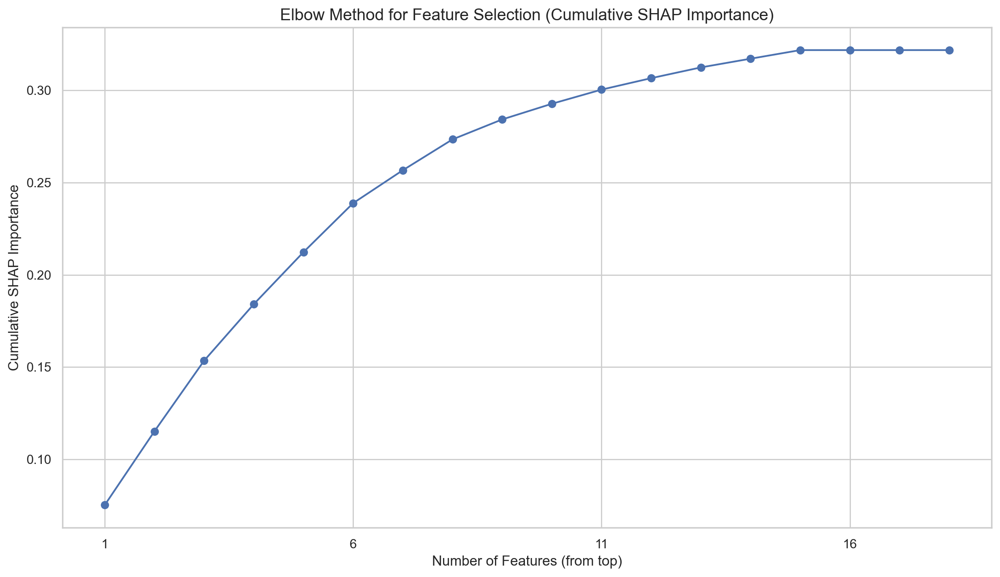

In [85]:
# Extract importance values
importance_values = [item[1] for item in shap_importance_list]

# Calculate cumulative importance
cumulative_importance = [sum(importance_values[:i+1]) for i in range(len(importance_values))]

# Plotting with adjustments
plt.figure(figsize=(12, 7))  # Increase figure size
plt.plot(range(1, len(importance_values) + 1), cumulative_importance, marker='o', linestyle='-')
plt.xlabel("Number of Features (from top)", fontsize=12)
plt.ylabel("Cumulative SHAP Importance", fontsize=12)
plt.title("Elbow Method for Feature Selection (Cumulative SHAP Importance)", fontsize=14)
plt.grid(True)

# Adjust x-axis ticks to be less dense (show every 5 features)
plt.xticks(range(1, len(importance_values) + 1, 5))

plt.tight_layout()
plt.show()

In [86]:
# Since no elbow we settle for the top 30 variables as this captures over 80% of the total importance
# one_third = len(sorted_features) // 3
top_influential_variables = np.array(sorted_features)[:11]

# Print the top influential variables
print("*** Top 11 influential variables based on elbow ***")
print(top_influential_variables)
print("*** All variables sorted in order of influence ***")
print(sorted_features)

*** Top 11 influential variables based on elbow ***
['RETAILXMV' 'RETAILMV' 'LTIR' 'CPI' 'IPI' 'EPI' 'PPIIP' 'AGRPROD' 'MMR'
 'RETAILGF' 'GOODFBT']
*** All variables sorted in order of influence ***
['RETAILXMV', 'RETAILMV', 'LTIR', 'CPI', 'IPI', 'EPI', 'PPIIP', 'AGRPROD', 'MMR', 'RETAILGF', 'GOODFBT', 'RETAILGSR', 'UNERWG', 'WPI', 'UR', 'ECBIRRO', 'ECBDFR', 'ECBMLFR']


# ***CNN-LSTM + Variable Selection***

In [87]:

# Add the target variable to the list of influential variables
top_influential_variables = np.append(top_influential_variables, target)
data_lsv = data_ls[top_influential_variables]


In [33]:
# model_var_sel, X_train_var_sel, X_test_var_sel, cnn_mae_var_sel, cnn_rmse_var_sel = cnn_lstm_model(data_lsv, scaler_y)

# CNN-LSTM + VAE

In [440]:

class VAE(Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = tf.keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = tf.keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            # reconstruction_loss = tf.reduce_mean(tf.reduce_sum(tf.square(data - reconstruction), axis=1))
            mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.SUM)
            reconstruction_loss = mse(data, reconstruction)
            # mse = tf.keras.losses.MeanSquaredError()
            # reconstruction_loss = mse(data, reconstruction)

            kl_loss = -0.5 * tf.reduce_mean(tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1))
            total_loss = reconstruction_loss + kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

def build_vae(input_dim, latent_dim=5):
    # Encoder
    encoder_inputs = Input(shape=(input_dim,))
    x = layers.Dense(64, activation="selu")(encoder_inputs)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)

    def sampling(args):
        z_mean, z_log_var = args
        epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], latent_dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

    z = layers.Lambda(sampling)([z_mean, z_log_var])
    encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")

    # Decoder
    latent_inputs = Input(shape=(latent_dim,))
    x = layers.Dense(64, activation="selu")(latent_inputs)
    decoder_outputs = layers.Dense(input_dim, activation="selu")(x)
    decoder = Model(latent_inputs, decoder_outputs, name="decoder")

    # VAE Model
    vae = VAE(encoder, decoder)
    vae.compile(optimizer="adam")
    return vae, encoder



In [441]:
# print(data_x.head())

In [442]:
# # 1. Extract raw features (no lagging yet)
# X_vae = data.copy().drop(columns=['CPI'])
# y_target = data['CPI']
#
# # 2. Scale & run VAE (as you already have)
# vae, encoder = build_vae(X_vae.shape[1], latent_dim=5)
# vae.fit(X_vae, X_vae, epochs=50, batch_size=32)
# _, _, z_encoded = encoder.predict(X_vae)
#
# # 3. Combine compressed features + target
# compressed_df = pd.DataFrame(z_encoded, columns=[f'z{i+1}' for i in range(z_encoded.shape[1])], index=data.index)
# compressed_df['CPI'] = y_target.values
#
# # 4. Apply lagging
# data_ls_compressed = create_lag_features(compressed_df, columns=compressed_df.columns, lags=3)
# data_ls_compressed.dropna(inplace=True)

def prepare_vae_data(data):
    # 1. Extract raw features (no lagging yet)
    X_vae = data.copy().drop(columns=[target])
    y_target = data[target]

    # 2. Scale & run VAE (as you already have)
    vae, encoder = build_vae(X_vae.shape[1], latent_dim=5)
    vae.fit(X_vae, X_vae, epochs=50, batch_size=32)

    _, _, z_encoded = encoder.predict(X_vae)

    # 3. Combine compressed features + target
    compressed_df = pd.DataFrame(z_encoded, columns=[f'z{i+1}' for i in range(z_encoded.shape[1])], index=data.index)
    compressed_df[target] = y_target.values

    # 4. Apply lagging
    # data_ls_compressed = create_lag_features(compressed_df.copy(), columns=compressed_df.columns, lags=3)
    # data_ls_compressed.dropna(inplace=True)

    return compressed_df


In [452]:
print(df_t.head())

             GOODFBT   ECBIRRO    UNERWG       IPI      LTIR  RETAILGSR  \
DATE                                                                      
1999-09-01 -0.867646 -0.002987  0.089419  0.781145  0.240954  -0.904623   
1999-10-01 -0.607738 -0.002987 -0.834576  0.382228  0.393956  -0.351709   
1999-11-01 -0.085768  3.084042 -0.834576  1.155460 -1.809275  -0.075069   
1999-12-01 -0.086127 -0.002987 -0.834576  1.646838  2.627787  -0.351709   
2000-01-01  0.173425 -0.002987 -0.834576  0.490009 -0.248653   0.200473   

            RETAILXMV    ECBDFR       MMR  RETAILMV  ...        UR       CPI  \
DATE                                                 ...                       
1999-09-01   0.001775 -0.020179 -0.058185  0.567228  ... -0.021704  0.139913   
1999-10-01   0.001458 -0.020179  0.259429 -0.276280  ... -0.076284  0.415106   
1999-11-01   0.001142  3.107625 -2.522616  0.004889  ... -0.130312  0.278434   
1999-12-01   0.000826 -0.020179  2.111088  0.566218  ... -0.102776 -0.4132

In [627]:

data_comp = prepare_vae_data(df_datax)


Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - kl_loss: 16.1724 - loss: 66.5728 - reconstruction_loss: 50.4004
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - kl_loss: 7.9632 - loss: 50.6347 - reconstruction_loss: 42.6715
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - kl_loss: 5.3008 - loss: 42.9548 - reconstruction_loss: 37.6539
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - kl_loss: 4.3195 - loss: 39.4928 - reconstruction_loss: 35.1733
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - kl_loss: 3.7158 - loss: 36.5977 - reconstruction_loss: 32.8820
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 663us/step - kl_loss: 3.3594 - loss: 35.1074 - reconstruction_loss: 31.7481
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - kl_loss: 3.2362 - loss: 34.8609 - reconstruction_loss: 31.6247
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - kl_loss: 3.0980 - loss: 31.6819 - reconstruction_loss: 28.5840
Epoch 9/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - kl_loss: 3.0454 - loss: 32.3454 -

In [628]:
# X_train, y_train, X_test, y_test, scaler_y = prep_data_for_cnn_r(data_ls_vae, 'CPI', test_size=24)
# cnn_lstm_model(compressed_df, scaler_y)
print(data_comp.shape)
print(data_comp.head())
# print(data_ls_compressed.shape)

(272, 6)
                  z1        z2        z3        z4        z5   CPI_t+1
DATE                                                                  
2002-05-01  2.012949 -0.199803 -0.106268 -1.334075 -0.048021 -0.393602
2002-06-01  0.723616 -0.080984  0.171048  0.394363 -2.274540  0.265168
2002-07-01  1.614109  0.091194  0.509899  0.691576 -0.738194 -0.393097
2002-08-01 -0.099451 -2.472450  1.643974 -1.813508 -0.463287  0.396619
2002-09-01  0.026710 -0.989542 -0.300707  0.904859 -0.267435 -0.261646


Epoch 1/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 1.1397 - val_loss: 1.3203
Epoch 2/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 1.1323 - val_loss: 1.3017
Epoch 3/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 1.1266 - val_loss: 1.2836
Epoch 4/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 1.1207 - val_loss: 1.2654
Epoch 5/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 1.1143 - val_loss: 1.2467
Epoch 6/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 1.1066 - val_loss: 1.2273
Epoch 7/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 1.0974 - val_loss: 1.2072
Epoch 8/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 1.0862 - val_loss: 1.1863
Epoch 9/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 1.0726 - val_loss: 1.1653
Epoch 10/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 1.0567 - val_loss: 1.1449
Epoch 11/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 1.0383 - val_loss: 1.1262
Epoch 12/600
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 1.0176 - val_lo

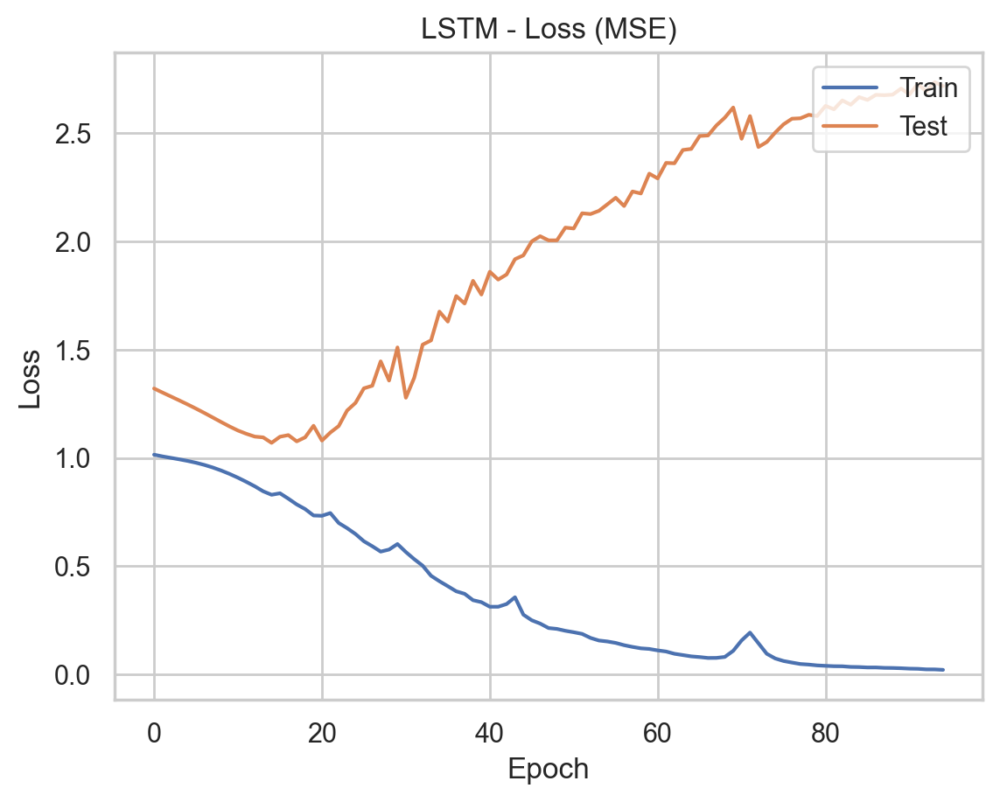

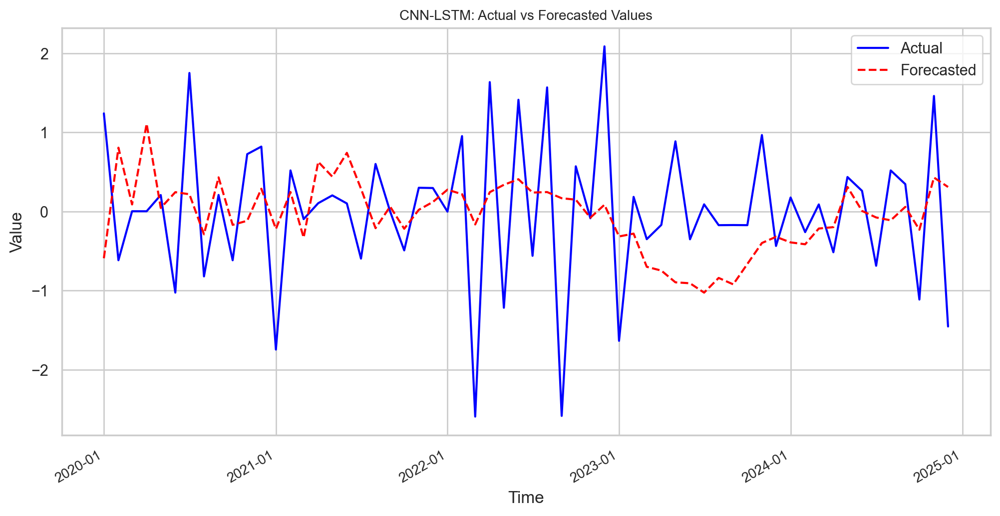

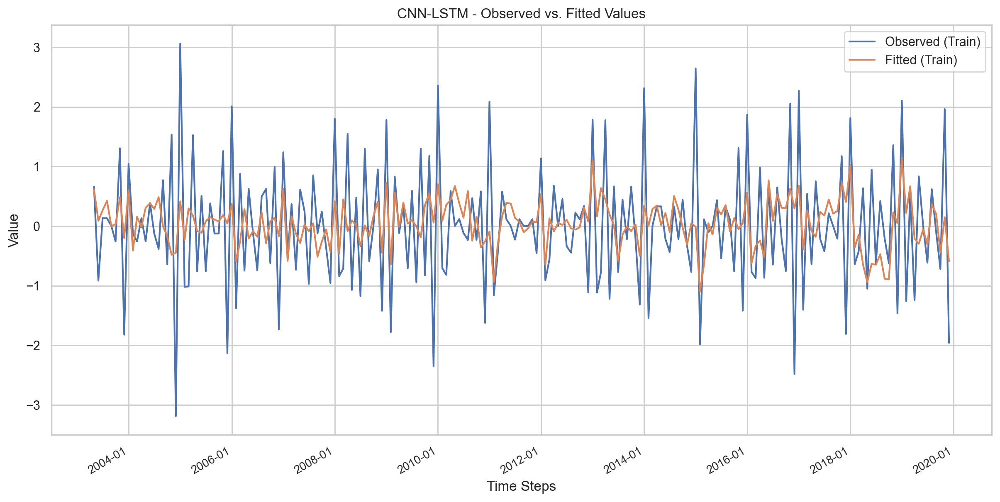

Mean Absolute Error (MAE): 0.78485405
Root Mean Squared Error (RMSE): 0.99735873


In [629]:
model, X_train, X_test, cnn_mae, cnn_rmse = cnn_lstm_model_1(data_comp, target, test_size=test_size, look_back=12)

In [ ]:
print(data_comp.shape)
print(data_comp.columns)

Epoch 1/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - loss: 0.9922 - val_loss: 0.6552
Epoch 2/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.9695 - val_loss: 0.6439
Epoch 3/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.9547 - val_loss: 0.6341
Epoch 4/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.9420 - val_loss: 0.6253
Epoch 5/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.9308 - val_loss: 0.6171
Epoch 6/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.9208 - val_loss: 0.6092
Epoch 7/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.9115 - val_loss: 0.6015
Epoch 8/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.9028 - val_loss: 0.5938
Epoch 9/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.8941 - val_loss: 0.5860
Epoch 10/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.8851 - val_loss: 0.5781
Epoch 11/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.8756 - val_loss: 0.5705
Epoch 12/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.8652 - val_l

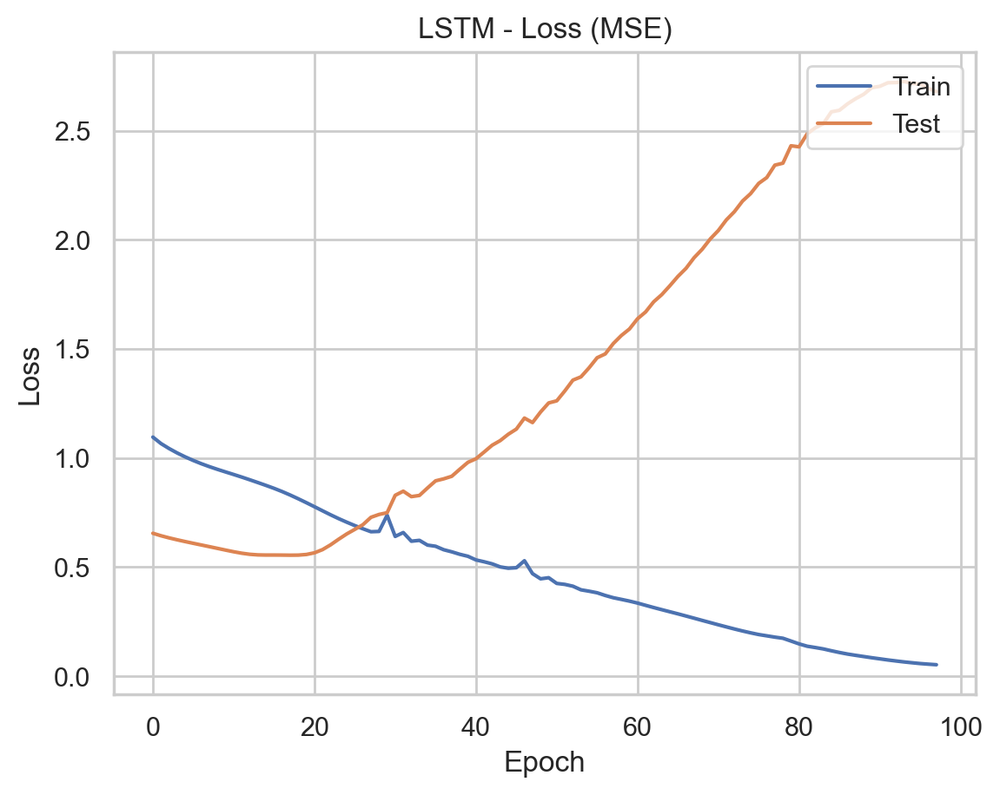

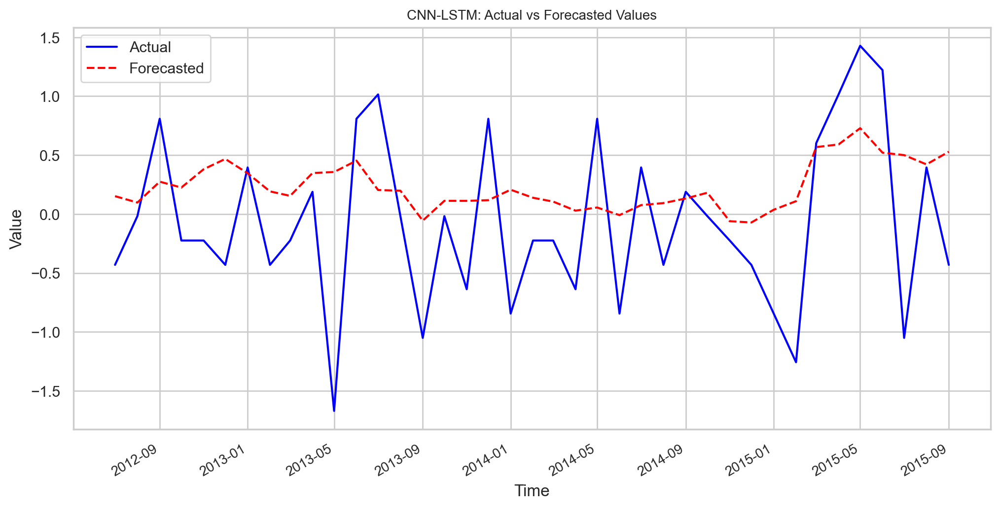

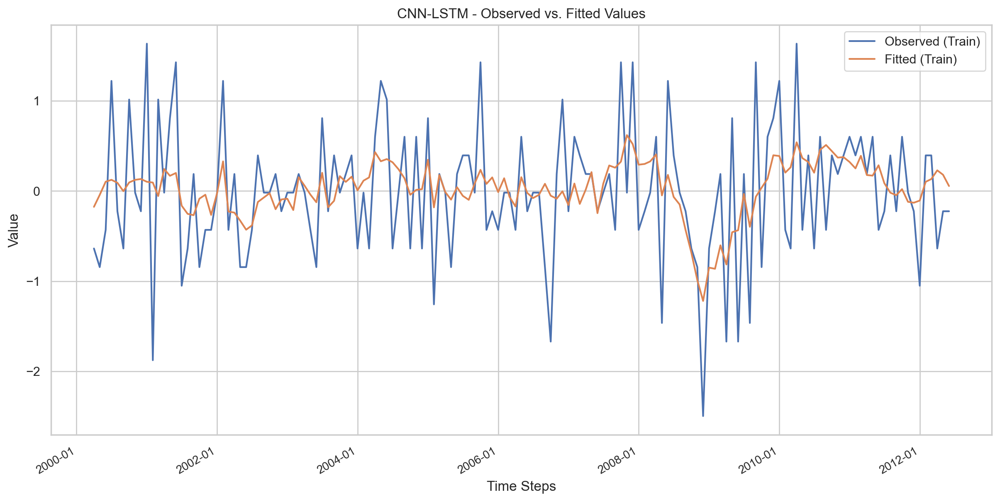

Mean Absolute Error (MAE): 0.58030698
Root Mean Squared Error (RMSE): 0.72179379


In [83]:
data_ls_vae = data_l[['RETAILXMV', 'RETAILMV', 'LTIR', 'CPI', 'IPI', 'EPI', 'PPIIP', 'AGRPROD', 'MMR', 'RETAILGF', 'GOODFBT', 'dfHICP_L1']]
model_cnn_var, X_train_cnn_var, X_test_cnn_var, cnn_mae_vae, cnn_rmse_vae = cnn_lstm_model_1(data_ls_vae, test_size)


# CNN-LSTM 2x2 Kernel + VAE

In [71]:
print(data_comp.describe())

               z1          z2          z3          z4          z5   dfHICP_L1
count  198.000000  198.000000  198.000000  198.000000  198.000000  198.000000
mean    -0.026963    0.122943    0.054689   -0.063781    0.071685   -0.007501
std      1.115976    1.131251    1.079635    1.243192    1.047074    0.719711
min     -3.544569   -3.139153   -3.630792   -3.123074   -2.739917   -2.496712
25%     -0.738798   -0.657269   -0.680492   -0.822042   -0.582557   -0.431063
50%      0.037380    0.166278    0.047264   -0.158392    0.082898   -0.017933
75%      0.666895    0.928682    0.883877    0.567258    0.865219    0.395196
max      3.360082    2.965121    3.490178    4.473204    2.485763    1.634586


Epoch 1/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.9781 - val_loss: 0.6141
Epoch 2/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.9637 - val_loss: 0.6058
Epoch 3/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.9538 - val_loss: 0.5983
Epoch 4/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.9429 - val_loss: 0.5913
Epoch 5/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.9372 - val_loss: 0.5849
Epoch 6/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.9351 - val_loss: 0.5791
Epoch 7/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.9258 - val_loss: 0.5737
Epoch 8/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.9180 - val_loss: 0.5688
Epoch 9/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.9120 - val_loss: 0.5643
Epoch 10/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.9025 - val_loss: 0.5602
Epoch 11/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.8969 - val_loss: 0.5562
Epoch 12/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.8889 - val_l

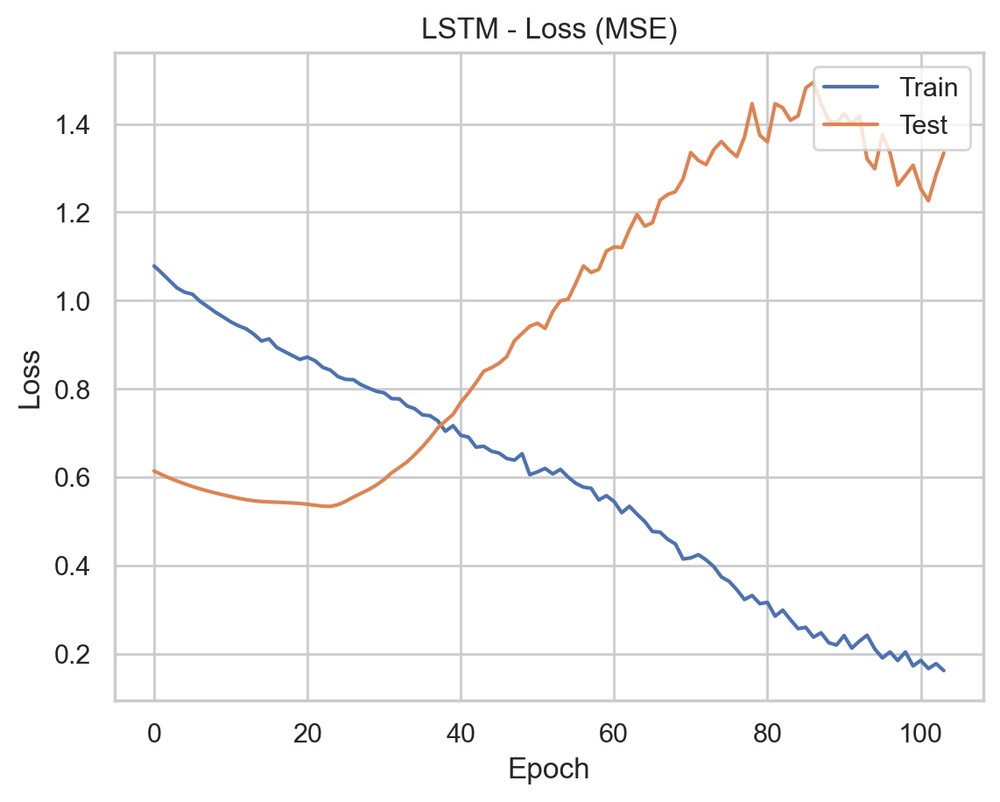

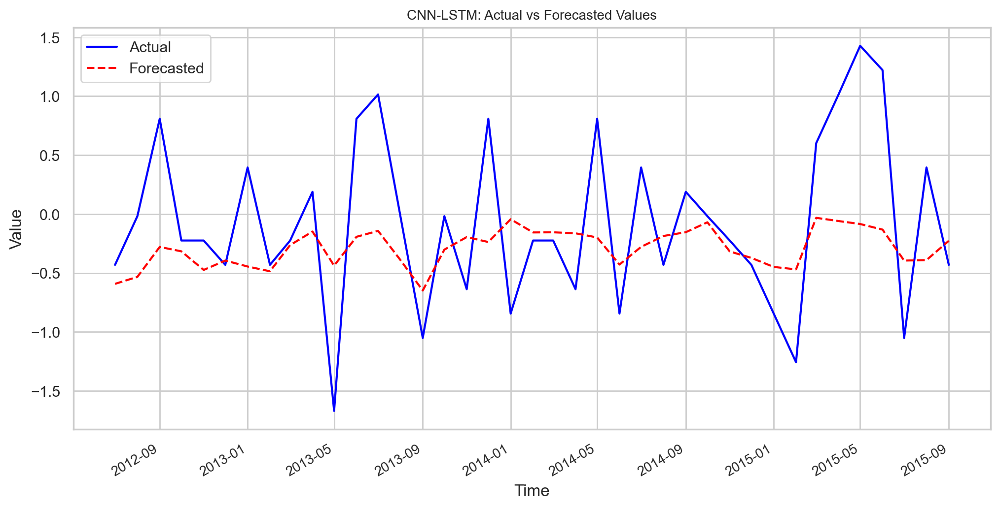

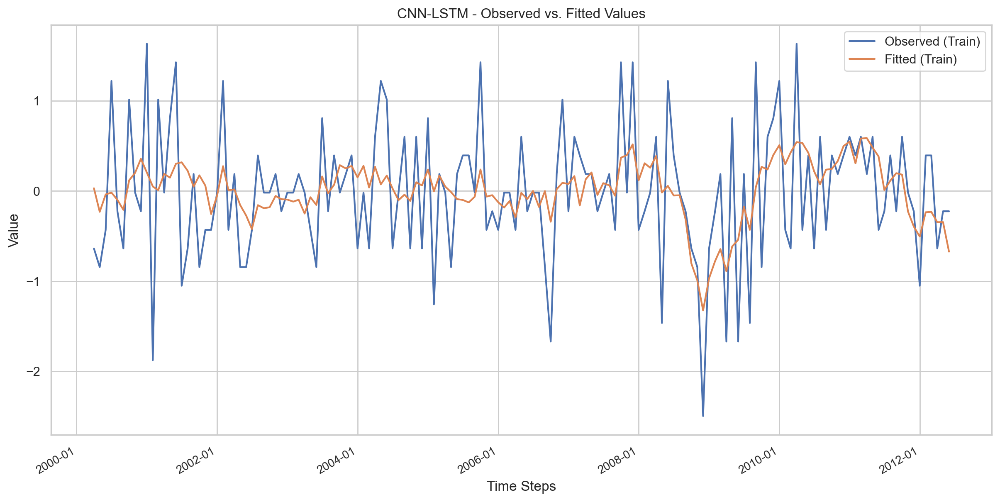

Mean Absolute Error (MAE): 0.53982965
Root Mean Squared Error (RMSE): 0.68221032


In [72]:
modelx, X_train, X_test, cnn_x_mae, cnn_x_rmse = cnn_lstm_model_1(data_comp, test_size=test_size, look_back=12)

# All results including CNN-LSTM + Variable Selection (VarSel)
For one sample run

In [96]:
print(f'CNN-LSTM (MAE) + VAE: {cnn_mae_vae}')
print(f'CNN-LSTM (RMSE) + VAE: {cnn_rmse_vae}')
print(f'CNN-LSTM-X (MAE) + VAE +: {cnn_x_mae}')
print(f'CNN-LSTM-X (RMSE) + VAE: {cnn_x_rmse}')
print(f'CNN-LSTM (MAE) + VarSel: {cnn_mae_var_sel}')
print(f'CNN-LSTM (RMSE) + VarSel: {cnn_rmse_var_sel}')
print(f'CNN-LSTM (MAE): {cnn_mae}')
print(f'CNN-LSTM (RMSE): {cnn_rmse}')
print(f'VAR (MAE): {var_mae}')
print(f'VAR (RMSE): {var_rmse}')
print(f'ARIMA (MAE): {arima_mae}')
print(f'ARIMA (RMSE): {arima_rmse}')
print(f'SARIMA (MAE): {sarima_mae}')
print(f'SARIMA (RMSE): {sarima_rmse}')


CNN-LSTM (MAE) + VAE: 0.4948176935522657
CNN-LSTM (RMSE) + VAE: 0.5697586917563482
CNN-LSTM-X (MAE) + VAE +: 0.6321482811855953
CNN-LSTM-X (RMSE) + VAE: 0.7617335777374941
CNN-LSTM (MAE) + VarSel: 0.712511442535674
CNN-LSTM (RMSE) + VarSel: 0.8240586055260657
CNN-LSTM (MAE): 0.6977806215989023
CNN-LSTM (RMSE): 0.7987225353817875
VAR (MAE): 0.8014298390164912
VAR (RMSE): 0.9476709013269036
ARIMA (MAE): 0.7514280039561845
ARIMA (RMSE): 0.8622464623464487
SARIMA (MAE): 0.6594376669275857
SARIMA (RMSE): 0.792669163420326


# CNN-VAE Setup

In [108]:

def prepare_data_cnn_vae(data, target_column=target, test_size=test_size, test_size_percent=False):
    """
    Splits the data into training and testing sets and reshapes it for ConvLSTM2D.

    Parameters:
    - data (DataFrame): The input dataset.
    - target_column (str): The column name of the target variable.
    - test_size (int or float): Number of test samples (if int) or percentage of data for testing (if float).
    - test_size_percent (bool): If True, interprets test_size as a percentage (0-1).

    Returns:
    - X_train, y_train, X_test, y_test: Training and testing datasets, reshaped for ConvLSTM2D.
    """
    if test_size_percent:
        test_size = int(len(data) * test_size)  # Convert percentage to absolute count

    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]
    train_index = train_df.index
    test_index = test_df.index

    X_train = train_df.drop(target_column, axis=1).values
    y_train = train_df[target_column].values
    X_test = test_df.drop(target_column, axis=1).values
    y_test = test_df[target_column].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, train_index, test_index

# BEST SO FAR 128, 16
def build_model_vae(input_shape):
    """Builds and compiles a ConvLSTM2D model."""
    model = Sequential([
        Bidirectional(ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='tanh', return_sequences=True, input_shape=input_shape)),
        Bidirectional(ConvLSTM2D(filters=8, kernel_size=(1, 1), activation='tanh', return_sequences=False)),
        Flatten(),
        Dense(1)
    ])
    opt = Adam(learning_rate=0.0009)
    model.compile(optimizer=opt, loss='mse')
    return model

def train_model_vae(model, X_train, y_train):
    """Trains the model with early stopping."""
    early_stopping = EarlyStopping(monitor='val_loss', patience=80, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=600, batch_size=48, validation_split=0.2, callbacks=[early_stopping], shuffle=False)
    return history


def cnn_lstm_model_vae(data, scaler_y, test_size=24):
    """Main function to execute the pipeline."""
    X_train, y_train, X_test, y_test, train_index, test_index = prepare_data_cnn_vae(data, test_size=test_size, test_size_percent=False)
    model = build_model_vae((X_train.shape[0], 1, 1, X_train.shape[-1]))
    history = train_model_vae(model, X_train, y_train)

    loss, predictions = evaluate_model(model, X_test, y_test)
    print(f'Test Loss: {loss}')

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
    plot_cnn_forecast = plot_predictions(y_test_actual, predictions_actual, test_index)
    plot_loss(history)

    predictions_train = model.predict(X_train, verbose=0) # Predict on X_train
    predictions_train_actual = inverse_transform(scaler_y, predictions_train) # Inverse transform fitted values
    y_train_actual = inverse_transform(scaler_y, y_train) # Inverse transform y_train

    # --- Plot Observed vs Fitted on Training Data ---
    plot_cnn_obs_vs_fitted = plot_observed_vs_fitted(y_train_actual, predictions_train_actual, train_index) # Pass y_train_actual and predictions_train_actual
    # plot_observed_vs_fitted(y_train, predictions)

    print(f'Mean Absolute Error (MAE): {mae}')
    print(f'Root Mean Squared Error (RMSE): {rmse}')
    return model, X_train, X_test, mae, rmse



Epoch 1/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.6615 - val_loss: 1.5046
Epoch 2/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6602 - val_loss: 1.5046
Epoch 3/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6590 - val_loss: 1.5046
Epoch 4/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6578 - val_loss: 1.5044
Epoch 5/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6567 - val_loss: 1.5039
Epoch 6/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6555 - val_loss: 1.5031
Epoch 7/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6543 - val_loss: 1.5019
Epoch 8/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6529 - val_loss: 1.5003
Epoch 9/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6515 - val_loss: 1.4983
Epoch 10/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6499 - val_loss: 1.4958
Epoch 11/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6482 - val_loss: 1.4928
Epoch 12/600
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6463 - val_loss: 1.489

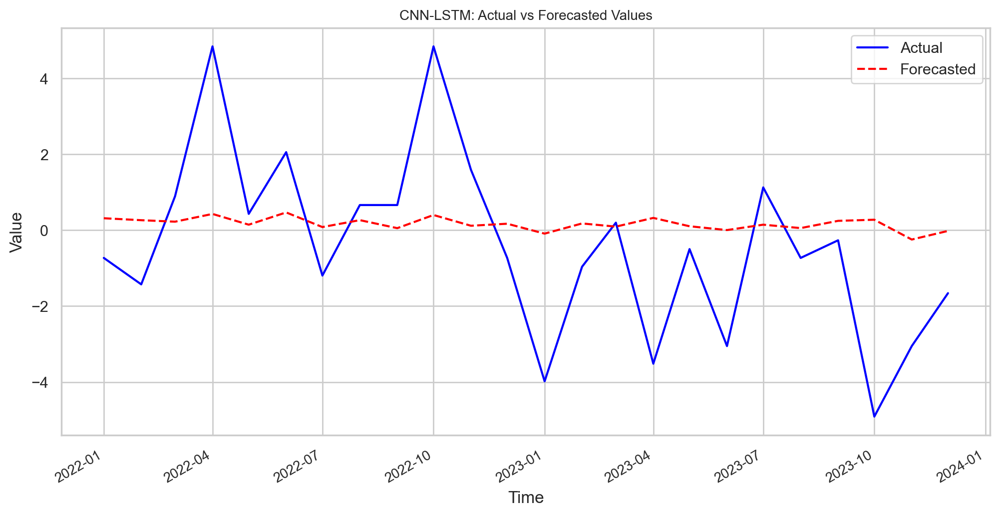

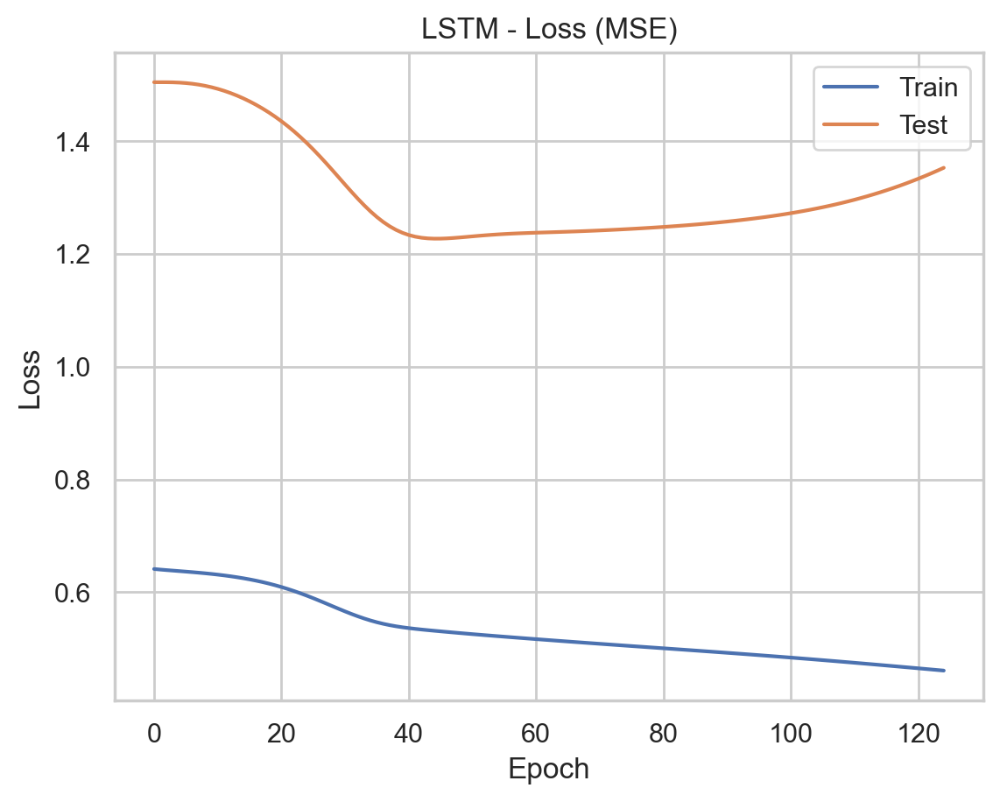

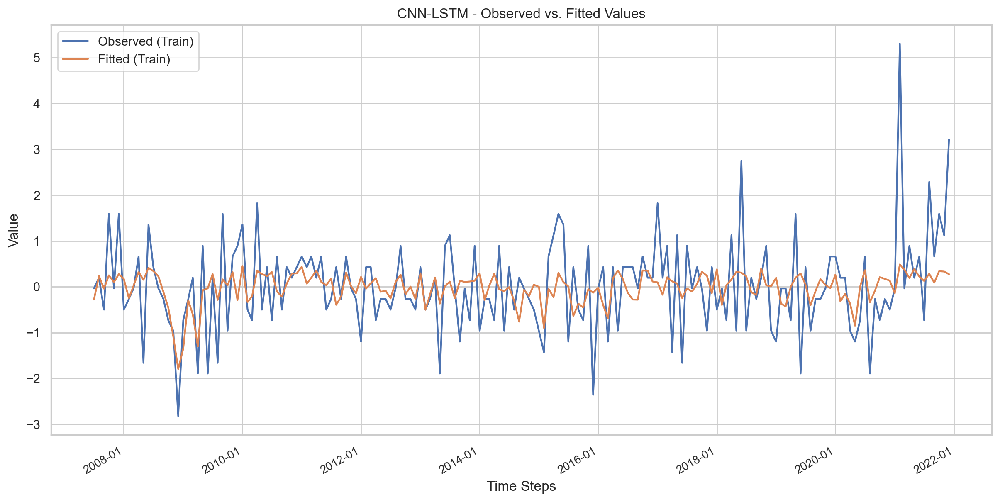

Mean Absolute Error (MAE): 1.8054856741902148
Root Mean Squared Error (RMSE): 2.340843328162818


In [109]:
model, X_train, X_test, cnn_vae_mae, cnn_vae_rmse = cnn_lstm_model_vae(data_comp, scaler_y)


In [233]:
# Call
# main(data_ls, scaler_y)


Mean Absolute Error (MAE): 0.46951469946838625
Root Mean Squared Error (RMSE): 0.6148211783163768

# ***Robust Test***

# ***ARIMA***

In [31]:
read_dir = r_State_Dir
# Function for created multi-step ahead data sets
def shift_target_per_step(data, target_col='CPI', horizon=1):
    data = data.copy()
    data[target_col] = data[target_col].shift(-horizon + 1)
    return data.dropna()

In [47]:

def train_and_evaluate_arima_model(data, auto_arima_model, title='ARIMA: Observed vs Fitted (24 Months Rolling)', target_column=target, test_size=test_size):
    """
    Performs a rolling multi-step-ahead ARIMA forecast for the entire test dataset.

    Parameters:
    - train_df (pd.DataFrame): Training data
    - test_df (pd.DataFrame): Test data
    - target_column (str): The target variable for evaluation (default 'CPI')
    - steps (int): Number of steps ahead for each rolling forecast

    Returns:
    - forecast_df (pd.DataFrame): Forecasted values for the entire test period
    - mae (float): Mean Absolute Error
    - rmse (float): Root Mean Squared Error
    """

    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]

    # Extract target series
    train_series = train_df[target_column]
    test_series = test_df[target_column]

    # Perform rolling forecasts
    history = train_series.tolist()
    predictions = []

    for i in range(len(test_series)):
        arima_model = ARIMA(history, order=auto_arima_model.order)  # Refit model each step
        arima_model_fit = arima_model.fit()
        forecast = arima_model_fit.forecast(steps=1)  # Forecast 'steps' ahead
        predictions.append(forecast[0])  # Store last predicted step
        history.append(test_series.iloc[i])  # Append actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, index=test_series.index, columns=[target_column])

    # Compute evaluation metrics
    # mae = mean_absolute_error(test_series, forecast_df[target_column])
    mae = mean_absolute_error(test_series.values, predictions)
    rmse = np.sqrt(mean_squared_error(test_series, forecast_df[target_column]) )

    return forecast_df, mae, rmse

In [49]:
horizon_name = f"dfHICP_L1"


In [51]:

arima_maes = []
arima_rmses = []
arima_all_forecasts = []

for i in range(100):

    filename = f"{horizon_name}_rolling_data_norm_{i + 1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")

    # Read shuffled data from CSV file
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # Create data DataFrame with selected columns
    # random_data.drop('HICP', axis=1)
    # df = random_data.copy()
    # data = shift_target_per_step(df, horizon=1)
    forecasted_cpi, mae, rmse = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=test_size)
    arima_maes.append(mae)
    arima_rmses.append(rmse)
    arima_all_forecasts.append(forecasted_cpi)

# Calculate and print average MAE and RMSE for the ARIMA model
avg_arima_mae = np.mean(arima_maes)
avg_arima_rmse = np.mean(arima_rmses)


In [52]:

# Calculate and print average MAE and RMSE for the ARIMA model
avg_arima_mae = np.mean(arima_maes)
avg_arima_rmse = np.mean(arima_rmses)

print(f'ARIMA Average MAE: {avg_arima_mae}')
print(f'ARIMA Average RMSE: {avg_arima_rmse}')


ARIMA Average MAE: 0.7460256308991967
ARIMA Average RMSE: 1.0108396976208913


VAR Average MAE: 0.7460256308991967
VAR Average RMSE: 1.0108396976208913


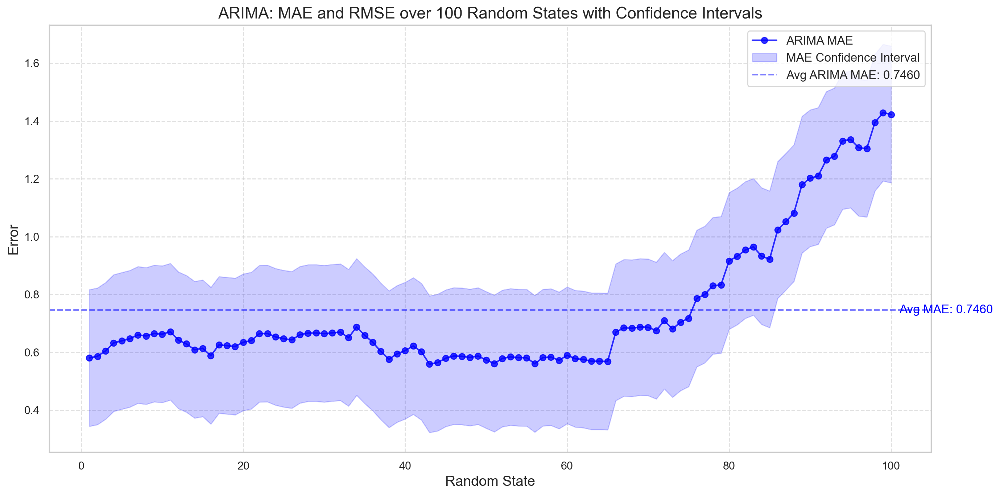

In [53]:

# Calculate and print average MAE and RMSE for the VAR model
avg_arima_mae = np.mean(arima_maes)
avg_arima_rmse = np.mean(arima_rmses)

print(f'VAR Average MAE: {avg_arima_mae}')
print(f'VAR Average RMSE: {avg_arima_rmse}')

# Calculate standard deviation for MAE and RMSE
std_arima_mae = np.std(arima_maes)
std_arima_rmse = np.std(arima_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), arima_maes, label='ARIMA MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(arima_maes) - std_arima_mae,
                 np.array(arima_maes) + std_arima_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_arima_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg ARIMA MAE: {avg_arima_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_arima_mae, f'Avg MAE: {avg_arima_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('ARIMA: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ***VAR***

In [55]:

# Directory to save CSV files
def train_and_evaluate_var_model(data, lag_order, test_size):
    """
    Trains and evaluates a VAR model on a given dataset.

    Args:
        data (pd.DataFrame): DataFrame with lagged time series data.
        lag_order (int): The lag order for the VAR model.

    Returns:
        tuple: MAE, RMSE, and forecasted CPI values.
    """

    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]

    # Fit the VAR model
    model = VAR(train_df)
    var_model = model.fit(lag_order)

    # Perform rolling forecasts
    predictions = []
    history = train_df.values.tolist()

    for i in range(len(test_df)):  # Ensure valid range
        input_data = np.array(history[-lag_order:])  # Use latest observed data
        forecast = var_model.forecast(input_data, steps=1)  # Forecast for `steps` ahead
        predictions.append(forecast[0])  # Store last step prediction
        history.append(test_df.iloc[i].values.tolist())  # Update with actual value

    # Convert predictions to DataFrame
    forecast_df = pd.DataFrame(predictions, columns=train_df.columns, index=test_df.index[:len(predictions)])

    # Extract actual and forecasted values for CPI
    actual_cpiauscl = test_df[target][:len(predictions)]
    forecasted_cpiauscl = forecast_df[target]

    # Compute evaluation metrics
    mae = mean_absolute_error(actual_cpiauscl, forecasted_cpiauscl)
    rmse = np.sqrt(mean_squared_error(actual_cpiauscl, forecasted_cpiauscl))
    return mae, rmse, forecasted_cpiauscl


In [57]:

# Perform robust testing with 50 random states
var_maes = []
var_rmses = []
var_all_forecasts = []

for i in range(100):
    # Read shuffled data from CSV file
    filename = f"{horizon_name}_rolling_data_norm_{i + 1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")

    # Read shuffled data from CSV file
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    mae, rmse, forecasted_cpiauscl = train_and_evaluate_var_model(data, lag_order, test_size=test_size)
    var_maes.append(mae)
    var_rmses.append(rmse)
    var_all_forecasts.append(forecasted_cpiauscl)

# ... (rest of your code for calculating averages and plotting)

VAR Average MAE: 0.8410981342837528
VAR Average RMSE: 1.1122534049859518


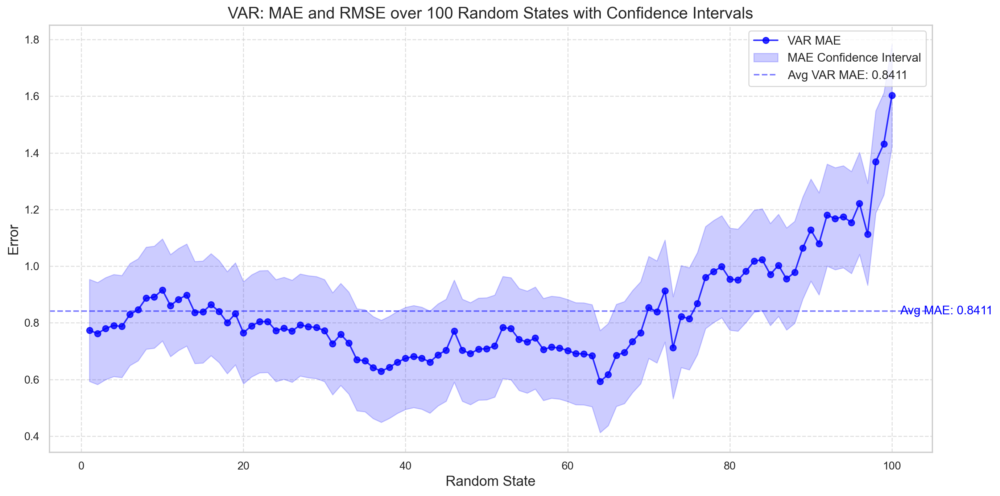

In [58]:

# Calculate and print average MAE and RMSE for the VAR model
avg_var_mae = np.mean(var_maes)
avg_var_rmse = np.mean(var_rmses)

print(f'VAR Average MAE: {avg_var_mae}')
print(f'VAR Average RMSE: {avg_var_rmse}')

# Calculate standard deviation for MAE and RMSE
std_var_mae = np.std(var_maes)
std_var_rmse = np.std(var_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), var_maes, label='VAR MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(var_maes) - std_var_mae,
                 np.array(var_maes) + std_var_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_var_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg VAR MAE: {avg_var_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_var_mae, f'Avg MAE: {avg_var_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('VAR: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ***SARIMA***

In [36]:

def train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size, target_column=target):
    """
    Trains and evaluates a VAR model on a given dataset.

    Args:
        data (pd.DataFrame): DataFrame with lagged time series data.
        lag_order (int): The lag order for the VAR model.

    Returns:
        tuple: MAE, RMSE, and forecasted CPI values.
    """

    # Extract CPIAUCSL series for ARIMA
    train_df = data.iloc[:-test_size]
    test_df = data.iloc[-test_size:]

    train_cpi_arima = train_df[target_column]
    test_cpi_arima = test_df[target_column]

    # Ensure the index is datetime for proper date manipulation
    train_cpi_arima.index = pd.to_datetime(train_cpi_arima.index)

    # # Fit SARIMA model to initial training data
    # sarima_model = SARIMAX(train_cpi_arima,
    #                        order=auto_arima_model_sarima.order,
    #                        seasonal_order=auto_arima_model_sarima.seasonal_order)
    # sarima_model_fit = sarima_model.fit(disp=False)  # disp=False to suppress convergence output

    history = train_cpi_arima.tolist()
    predictions = []

    for i in range(len(test_cpi_arima)):
        # Forecast the next step
        # Refit the model with the updated training data
        sarima_model = SARIMAX(history,
                               order=auto_arima_model_sarima.order,
                               seasonal_order=auto_arima_model_sarima.seasonal_order, enforce_stationarity=False,
                               enforce_invertibility=False)
        sarima_model_fit = sarima_model.fit(disp=False)
        forecast = sarima_model_fit.forecast(steps=1)
        predictions.append(forecast[0])
        history.append(test_cpi_arima.iloc[i])  # Append actual value

    forecast_df = pd.DataFrame(predictions, index=test_cpi_arima.index, columns=[target_column])

    mae_sarima = mean_absolute_error(test_cpi_arima, forecast_df[target_column])
    rmse_sarima = np.sqrt(mean_squared_error(test_cpi_arima, forecast_df[target_column]))
    forecasted_cpi = forecast_df[target_column]

    return mae_sarima, rmse_sarima, forecasted_cpi


In [37]:


# Perform robust testing with 50 random states
sarima_maes = []
sarima_rmses = []
sarima_all_forecasts = []
horizon_name = f"dfHICPL1"

for i in range(100):
    # Read shuffled data from CSV file
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # random_data = pd.read_csv(file_path)

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True)

    sample_size = len(data)
    test_size = int(sample_size * 0.2)


    # Create data DataFrame with selected columns
    # df = random_data.drop('HICP', axis=1)
    # data = shift_target_per_step(df, horizon=2)
    mae, rmse, forecasted_cpiauscl = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size, target_column=target)
    sarima_maes.append(mae)
    sarima_rmses.append(rmse)
    sarima_all_forecasts.append(forecasted_cpiauscl)

# ... (rest of your code for calculating averages and plotting)

SARIMA Average MAE: 0.7412303235696254
SARIMA Average RMSE: 1.0665405451403207


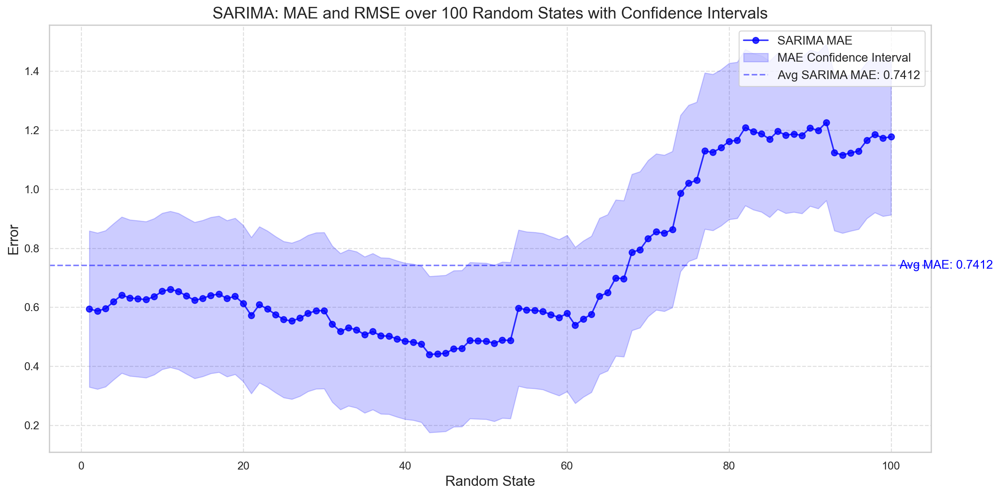

In [39]:

# Calculate and print average MAE and RMSE for the VAR model
avg_sarima_mae = np.mean(sarima_maes)
avg_sarima_rmse = np.mean(sarima_rmses)

print(f'SARIMA Average MAE: {avg_sarima_mae}')
print(f'SARIMA Average RMSE: {avg_sarima_rmse}')

# Calculate standard deviation for MAE and RMSE
std_sarima_mae = np.std(sarima_maes)
std_sarima_rmse = np.std(sarima_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), sarima_maes, label='SARIMA MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(sarima_maes) - std_sarima_mae,
                 np.array(sarima_maes) + std_sarima_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_sarima_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg SARIMA MAE: {avg_sarima_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_sarima_mae, f'Avg MAE: {avg_sarima_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('SARIMA: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

 # ***CNN-LSTM***

In [36]:
def prep_data_for_cnn_r(data_l, test_size, target_col="HICP_t1"):
    data_x = data_l.copy()

    # Initialize scalers
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Separate target and features
    y = data_x[[target_col]]
    X = data_x.drop(target_col, axis=1)

    # Scale the features and target
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Convert back to DataFrame (preserving column names and index)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    y_scaled_df = pd.DataFrame(y_scaled, columns=y.columns, index=y.index)

    # Concatenate scaled features and target
    data = pd.concat([X_scaled_df, y_scaled_df], axis=1)
    data_ls = data[['RETAILXMV', 'RETAILMV', 'LTIR', 'CPI', 'IPI', 'EPI', 'PPIIP', 'AGRPROD', 'MMR',
                     'RETAILGF', 'GOODFBT', 'HICP_t1']]

    # Shift the target column to align with forecasting horizon
    # data[target_col] = data_x[target_col].shift(-forecast_horizon)

    # columns_to_lag = [col for col in data.columns if col != target_col] # All columns except target
    # columns_to_lag = [col for col in data.columns]
    # Create lagged features
    # data_ls = create_lag_features(data, columns_to_lag, lags=lags)
    # data_ls.dropna(inplace=True)

    # if test_size_percent:
    #     test_size = int(len(data_ls) * test_size)  # Convert percentage to absolute count

    train_df = data_ls.iloc[:-test_size]
    test_df = data_ls.iloc[-test_size:]

    X_train = train_df.drop(target_col, axis=1).values
    y_train = train_df[target_col].values
    X_test = test_df.drop(target_col, axis=1).values
    y_test = test_df[target_col].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, scaler_y
    # return data_ls, scaler_X, scaler_y


In [60]:
# def prep_data_for_cnn_r(
#         data_l,
#         target_col='CPIAUCSL',
#         forecast_horizon=1,
#         lags=3,
#         test_size=12,
#         test_size_percent=False
# ):
#     data_x = data_l.copy()
# 
#     # Initialize scalers
#     scaler_X = StandardScaler()
#     scaler_y = StandardScaler()
# 
#     # Separate and scale features
#     y = data_x[[target_col]]
#     X = data_x.drop(columns=[target_col])
# 
#     X_scaled = scaler_X.fit_transform(X)
#     y_scaled = scaler_y.fit_transform(y)
# 
#     X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=data_x.index)
#     y_scaled_df = pd.DataFrame(y_scaled, columns=[target_col], index=data_x.index)
# 
#     # # Shift the target column to forecast `t+forecast_horizon`
#     # y_scaled_df[f'{target_col}_t+{forecast_horizon}'] = y_scaled_df[target_col].shift(-forecast_horizon)
#     # 
#     # # Build lagged features for target only
#     # for lag in range(lags):
#     #     y_scaled_df[f'{target_col}_t-{lag}'] = y_scaled_df[target_col].shift(lag)
#     # 
#     # # Merge features and target lags
#     # data_all = pd.concat([X_scaled_df, y_scaled_df[[f'{target_col}_t+{forecast_horizon}'] +
#     #                                                [f'{target_col}_t-{lag}' for lag in range(lags)]]], axis=1)
#     data_all = pd.concat([X_scaled_df, y_scaled_df])
# 
#     # Drop rows with NaNs from shifting
#     data_all.dropna(inplace=True)
# 
#     if test_size_percent:
#         test_size = int(len(data_all) * test_size)
# 
#     # Final input and output setup
#     # target_final = f'{target_col}_t+{forecast_horizon}'
#     # feature_cols = data_all.columns.drop(target_final)
# 
#     train_df = data_all.iloc[:-test_size]
#     test_df = data_all.iloc[-test_size:]
# 
#     X_train = train_df.drop(target_col, axis=1).values
#     y_train = train_df[target_col].values
#     X_test = test_df.drop(target_col, axis=1).values
#     y_test = test_df[target_col].values
# 
#     # X_train = train_df[feature_cols].values
#     # y_train = train_df[target_final].values
#     # X_test = test_df[feature_cols].values
#     # y_test = test_df[target_final].values
# 
#     # ConvLSTM input format: (samples, timesteps, rows, cols, channels)
#     # Flatten features into channels (1x1 image)
#     X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
#     X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))
# 
#     return X_train, y_train, X_test, y_test, scaler_y


In [ ]:
# filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
# file_path = os.path.join(all_LagsHICP_Dir, filename)
# data = pd.read_csv(file_path, index_col=0, parse_dates=True)
# prep_data_for_cnn_r(data, target, test_size=test_size)

In [ ]:
['UNERWG', 'ECBIRRO', 'ECBDFR', 'ECBMLFR', 'MMR', 'CPI', 'RETAILMV',
 'RETAILXMV', 'RETAILGSR', 'RETAILGF', 'GOODFBT', 'AGRPROD', 'PPIIP',
 'WPI', 'EPI', 'IPI', 'LTIR', 'UR', 'HICP_t1']

In [58]:
# Perform robust testing with 100 random states
cnn_old_maes = []
cnn_old_rmses = []
cnn_old_all_predictions = []

for i in range(100):
    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True)

    # X_train, y_train, X_test, y_test, scaler_y, 
    X_train, y_train, X_test, y_test, scaler_y = prep_data_for_cnn_r(data, test_size, "HICP_t1")
    model = build_model((1, 1, 1, X_train.shape[-1]))
    loss, predictions = evaluate_model(model, X_test, y_test)

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_old_maes.append(mae)
    cnn_old_rmses.append(rmse)
    cnn_old_all_predictions.append(predictions)

# Calculate and print average MAE and RMSE
avg_old_cnn_mae = np.mean(cnn_old_maes)
avg_old_cnn_rmse = np.mean(cnn_old_rmses)



In [103]:
print(f'Average MAE: {avg_old_cnn_mae}')
print(f'Average RMSE: {avg_old_cnn_rmse}')

Average MAE: 0.8648435733037233
Average RMSE: 1.1714229787962855


In [96]:

# Perform robust testing with 100 random states
cnn_maes = []
cnn_rmses = []
cnn_all_predictions = []

for i in range(100):
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # shuffled_data = pd.read_csv(file_path).drop('HICP', axis=1)

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True)
    # df = add_time_features(data)
    # sample_size = len(df)
    # test_size = int(sample_size * 0.2)
    
    X_train, y_train, X_test, y_test, test_index, train_index = prepare_data_1(data, target, test_size=test_size, look_back=12)
    model = build_model_1(X_train.shape[1:])
    # history = train_model_1(model, X_train, y_train)
    loss, predictions = evaluate_model_1(model, X_test, y_test)
    # y_test_actual = inverse_transform_1(scaler_y1, y_test)
    # predictions_actual = inverse_transform_1(scaler_y1, predictions)
    y_test_actual = y_test
    predictions_actual = predictions
    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
    
    # main(data, scaler_y)
    cnn_maes.append(mae)
    cnn_rmses.append(rmse)
    cnn_all_predictions.append(predictions)

# Calculate and print average MAE and RMSE
avg_cnn_mae = np.mean(cnn_maes)
avg_cnn_rmse = np.mean(cnn_rmses)


In [97]:
print(f'Average MAE: {avg_cnn_mae}')
print(f'Average RMSE: {avg_cnn_rmse}')

Average MAE: 0.8685363504698151
Average RMSE: 1.1775601246563177


Average MAE: 0.7696258215946666
Average RMSE: 1.010885800493961

CNN-LSTM Average MAE: 0.8753368549725393
CNN-LSTM Average RMSE: 1.1914213314241304


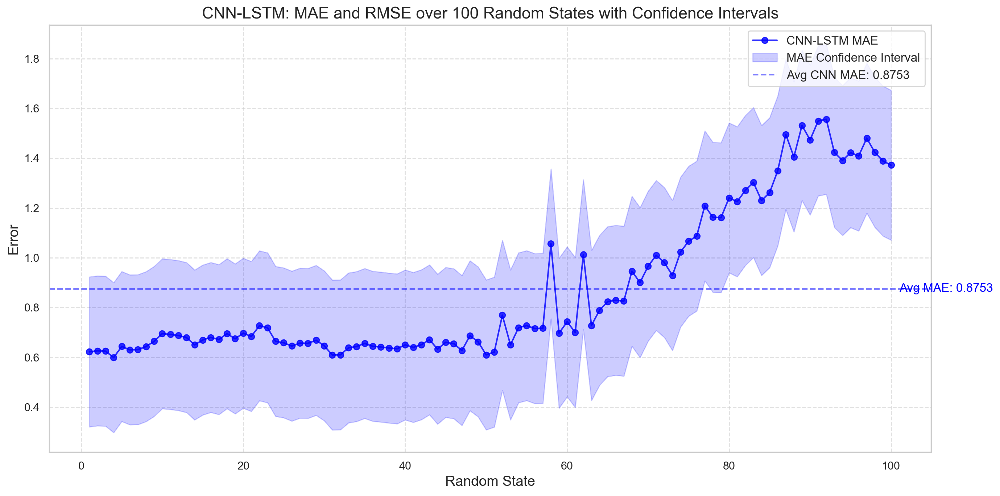

In [48]:

# Calculate and print average MAE and RMSE for the VAR model

print(f'CNN-LSTM Average MAE: {avg_cnn_mae}')
print(f'CNN-LSTM Average RMSE: {avg_cnn_rmse}')

# Calculate standard deviation for MAE and RMSE
std_cnn_mae = np.std(cnn_maes)
std_cnn_rmse = np.std(cnn_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), cnn_maes, label='CNN-LSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(cnn_maes) - std_cnn_mae,
                 np.array(cnn_maes) + std_cnn_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_cnn_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg CNN MAE: {avg_cnn_mae:.4f}')

# Add annotations for average values
plt.text(101, avg_cnn_mae, f'Avg MAE: {avg_cnn_mae:.4f}', color='blue', va='center', ha='left')

# Customize the plot
plt.title('CNN-LSTM: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()




# CNN_VAE

In [68]:
def prep_data_cnn_vae(data_l, test_size, target_col=target):
    data_x = data_l.copy()

    # Initialize scalers
    # scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Separate target and features
    y = data_x[[target_col]]
    X = data_x.drop(target_col, axis=1)

    # Scale the features and target
    # X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Convert back to DataFrame (preserving column names and index)
    # X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    y_scaled_df = pd.DataFrame(y_scaled, columns=y.columns, index=y.index)

    # Concatenate scaled features and target
    data = pd.concat([X, y_scaled_df], axis=1)

    # Shift the target column to align with forecasting horizon
    # data[target_col] = data_x[target_col].shift(-forecast_horizon)

    # # columns_to_lag = [col for col in data.columns if col != target_col] # All columns except target
    # columns_to_lag = [col for col in data.columns]
    # # Create lagged features
    # data_ls = create_lag_features(data, columns_to_lag, lags=lags)
    # data_ls.dropna(inplace=True)

    # if test_size_percent:
    #     test_size = int(len(data_ls) * test_size)  # Convert percentage to absolute count

    train_df = data_ls.iloc[:-test_size]
    test_df = data_ls.iloc[-test_size:]

    X_train = train_df.drop(target_col, axis=1).values
    y_train = train_df[target_col].values
    X_test = test_df.drop(target_col, axis=1).values
    y_test = test_df[target_col].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, scaler_y, test_df.index
    # return data_ls, scaler_X, scaler_y



In [45]:
file_path = os.path.join(all_LagsHICP_Dir, filename)
data = pd.read_csv(file_path, index_col=0, parse_dates=True)
print(data.head())

         z1        z2        z3        z4        z5  dfHICP_L1
0  0.892904  0.767035 -0.896674 -0.318218 -1.056714  -0.036184
1  0.525953  0.950787  0.378346  0.738866 -1.771777  -0.899165
2 -0.497501  1.572978  0.557825 -0.276399 -2.136590  -1.186825
3  0.365308  1.287154 -1.467810  0.019039 -2.650138  -0.611505
4  0.291953  1.158112 -0.155690  0.190750 -2.645472   1.689779


/var/folders/82/hxq3jkp51d38wnvh074k_2vh0000gn/T/ipykernel_2127/3921910337.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data = pd.read_csv(file_path, index_col=0, parse_dates=True)


In [100]:
# Perform robust testing with 100 random states
cnn_vae_maes = []
cnn_vae_rmses = []
cnn_vae_all_predictions = []

# model = build_model(1, 1, 1, X_train.shape[-1])

for i in range(100):
    # file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
    # shuffled_data = pd.read_csv(file_path)
    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    # filename = f"{horizon_name}_rolling_data_vae_{i + 1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data_comp = pd.read_csv(file_path, index_col=0, parse_dates=True)

    # sample_size = len(data)
    # test_size = int(sample_size * 0.2)
    # # 
    # df = add_time_features(data)
    # data_comp = prepare_vae_data(data.copy())
    
    X_train, y_train, X_test, y_test, test_index, train_index = prepare_data_1(data_comp, target, test_size=test_size, look_back=12)
    model = build_model_1(X_train.shape[1:])
    # history = train_model_1(model, X_train, y_train)
    loss, predictions = evaluate_model_1(model, X_test, y_test)
    # y_test_actual = inverse_transform_1(scaler_y1, y_test)
    # predictions_actual = inverse_transform_1(scaler_y1, predictions)
    y_test_actual = y_test
    predictions_actual = predictions
    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_vae_maes.append(mae)
    cnn_vae_rmses.append(rmse)
    cnn_vae_all_predictions.append(predictions)

# Calculate and print average MAE and RMSE
avg_cnn_vae_mae = np.mean(cnn_vae_maes)
avg_cnn_vae_rmse = np.mean(cnn_vae_rmses)


In [101]:
print(f'Average MAE: {avg_cnn_vae_mae}')
print(f'Average RMSE: {avg_cnn_vae_rmse}')

Average MAE: 0.8677177090516287
Average RMSE: 1.1754362808121401


VAE
Average MAE: 0.8651627719845969
Average RMSE: 1.173858745998291

If worse control Z

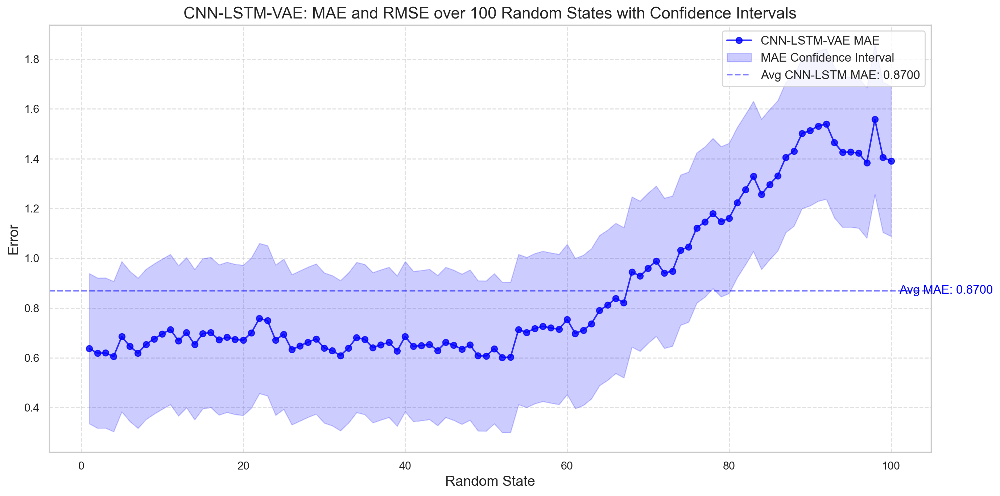

In [41]:

# Calculate standard deviation for MAE and RMSE
std_cnn_vae_mae = np.std(cnn_vae_maes)
std_cnn_vae_rmse = np.std(cnn_vae_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), cnn_vae_maes, label='CNN-LSTM-VAE MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(cnn_vae_maes) - std_cnn_vae_mae,
                 np.array(cnn_vae_maes) + std_cnn_vae_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=avg_cnn_vae_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg CNN-LSTM MAE: {avg_cnn_vae_mae:.4f}')
# plt.axhline(y=avg_var_rmse, color='green', linestyle='--', alpha=0.5, label=f'Avg VAR RMSE: {avg_var_rmse:.2f}')

# Add annotations for average values
plt.text(101, avg_cnn_vae_mae, f'Avg MAE: {avg_cnn_vae_mae:.4f}', color='blue', va='center', ha='left')
# plt.text(101, avg_var_rmse, f'Avg RMSE: {avg_var_rmse:.2f}', color='green', va='center', ha='left')

# Customize the plot
plt.title('CNN-LSTM-VAE: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ***CNN-LSTM + Variable Selection***

In [75]:

def prep_data_for_cnn_var_sel(data_l, target_col=target, forecast_horizon=1, lags=3, test_size=test_size, test_size_percent=False):

    # Variable selection
    data_x = data_l.copy()

    # Initialize scalers
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Separate target and features
    y = data_x[[target_col]]
    X = data_x.drop(target_col, axis=1)

    # Scale the features and target
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Convert back to DataFrame (preserving column names and index)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    y_scaled_df = pd.DataFrame(y_scaled, columns=y.columns, index=y.index)

    # Concatenate scaled features and target
    data = pd.concat([X_scaled_df, y_scaled_df], axis=1)

    # Shift the target column to align with forecasting horizon
    # data[target_col] = data_x[target_col].shift(-forecast_horizon)
    # columns_to_lag = [col for col in data.columns if col != target_col] # All columns except target

    # columns_to_lag = [col for col in data.columns]
    # # Create lagged features
    # data_l = create_lag_features(data, columns_to_lag, lags=lags)
    # data_l.dropna(inplace=True)

    data_ls = data_l[top_influential_variables]

    if test_size_percent:
        test_size = int(len(data_ls) * test_size)  # Convert percentage to absolute count

    train_df = data_ls.iloc[:-test_size]
    test_df = data_ls.iloc[-test_size:]

    X_train = train_df.drop(target_col, axis=1).values
    y_train = train_df[target_col].values
    X_test = test_df.drop(target_col, axis=1).values
    y_test = test_df[target_col].values

    X_train = X_train.reshape((X_train.shape[0], 1, 1, 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, 1, 1, X_test.shape[1]))

    return X_train, y_train, X_test, y_test, scaler_y, test_df.index
    # return data_ls, scaler_X, scaler_y


In [76]:
cnn_sel_maes = []
cnn_sel_rmses = []
cnn_sel_all_predictions = []

for i in range(100):

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")

    X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, target, test_size=test_size)
    model = build_model((1, 1, 1, X_train.shape[-1]))
    loss, predictions = evaluate_model(model, X_test, y_test)

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_sel_maes.append(mae)
    cnn_sel_rmses.append(rmse)
    cnn_sel_all_predictions.append(predictions)



In [77]:
# Calculate and print average MAE and RMSE
cnn_sel_avg_mae = np.mean(cnn_sel_maes)
cnn_sel_avg_rmse = np.mean(cnn_sel_rmses)
print(f'CNN+VS Average MAE: {cnn_sel_avg_mae}')
print(f'CNN+VS Average RMSE: {cnn_sel_avg_rmse}')

CNN+VS Average MAE: 0.6510814471911242
CNN+VS Average RMSE: 0.8844694343794334


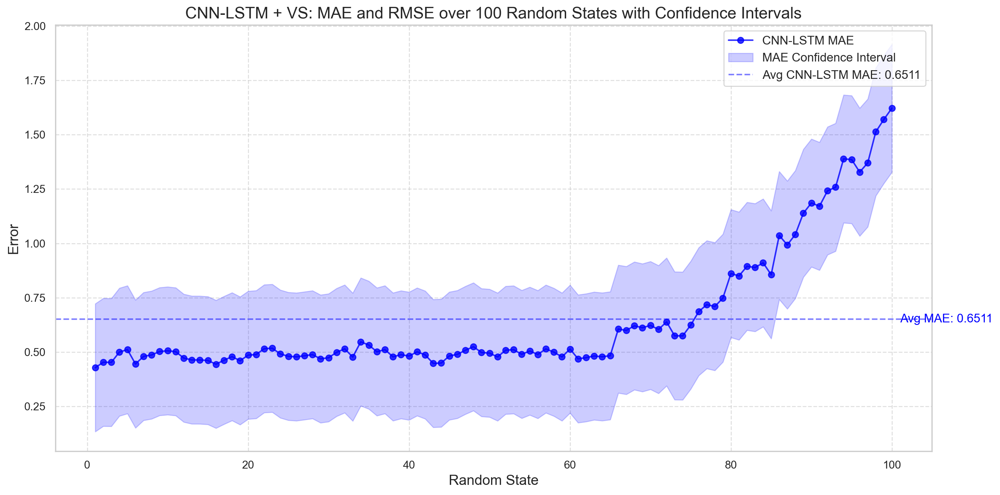

CNN+VS Average MAE: 0.6510814471911242
CNN+VS Average RMSE: 0.8844694343794334


In [78]:

# Calculate standard deviation for MAE and RMSE
std_cnn_sel_mae = np.std(cnn_sel_maes)
std_cnn_sel_rmse = np.std(cnn_sel_rmses)

# Plotting the MAEs and RMSEs with shaded confidence intervals
plt.figure(figsize=(14, 7))

# Plot VAR MAEs with shaded confidence interval
plt.plot(range(1, 101), cnn_sel_maes, label='CNN-LSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 101),
                 np.array(cnn_sel_maes) - std_cnn_sel_mae,
                 np.array(cnn_sel_maes) + std_cnn_sel_mae,
                 color='blue', alpha=0.2, label='MAE Confidence Interval')

# Add horizontal lines for average MAE and RMSE
plt.axhline(y=cnn_sel_avg_mae, color='blue', linestyle='--', alpha=0.5, label=f'Avg CNN-LSTM MAE: {cnn_sel_avg_mae:.4f}')
# plt.axhline(y=avg_var_rmse, color='green', linestyle='--', alpha=0.5, label=f'Avg VAR RMSE: {avg_var_rmse:.2f}')

# Add annotations for average values
plt.text(101, cnn_sel_avg_mae, f'Avg MAE: {cnn_sel_avg_mae:.4f}', color='blue', va='center', ha='left')
# plt.text(101, avg_var_rmse, f'Avg RMSE: {avg_var_rmse:.2f}', color='green', va='center', ha='left')

# Customize the plot
plt.title('CNN-LSTM + VS: MAE and RMSE over 100 Random States with Confidence Intervals', fontsize=16)
plt.xlabel('Random State', fontsize=14)
plt.ylabel('Error', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

print(f'CNN+VS Average MAE: {cnn_sel_avg_mae}')
print(f'CNN+VS Average RMSE: {cnn_sel_avg_rmse}')


# NEW CNN-LSTM

In [ ]:
cnn_new_maes = []
cnn_new_rmses = []
cnn_new_all_predictions = []

for i in range(100):

    filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
    file_path = os.path.join(all_LagsHICP_Dir, filename)
    data = pd.read_csv(file_path, index_col=0, parse_dates=True).drop(columns="HICP")


    X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, target, test_size=test_size)
    model = build_model((1, 1, 1, X_train.shape[-1]))
    loss, predictions = evaluate_model(model, X_test, y_test)

    y_test_actual = inverse_transform(scaler_y, y_test)
    predictions_actual = inverse_transform(scaler_y, predictions)

    mae = mean_absolute_error(y_test_actual, predictions_actual)
    rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

    # main(data, scaler_y)
    cnn_sel_maes.append(mae)
    cnn_sel_rmses.append(rmse)
    cnn_sel_all_predictions.append(predictions)



In [ ]:
model, X_train, X_test, cnn_mae, cnn_rmse = cnn_lstm_model_1(data_ls, scaler_y, test_size=test_size, look_back=12)


In [81]:
# avg_sarima_mae = np.mean(var_maes)
# avg_sarima_rmse = np.mean(var_rmses)
print(f'CNN-LSTM + VAE Average MAE: {avg_cnn_vae_mae}')
print(f'CNN-LSTM + VAE Average RMSE: {avg_cnn_vae_rmse}')
print(f'CNN-LSTM + VS Average MAE: {cnn_sel_avg_mae}')
print(f'CNN-LSTM + VS Selection Average RMSE: {cnn_sel_avg_rmse}')
print(f'CNN-LSTM Average MAE: {avg_cnn_mae}')
print(f'CNN-LSTM Average RMSE: {avg_cnn_rmse}')
print(f'ARIMA Average MAE: {avg_arima_mae}')
print(f'ARIMA Average RMSE: {avg_arima_rmse}')
print(f'VAR Average MAE: {avg_var_mae}')
print(f'VAR Average RMSE: {avg_var_rmse}')
print(f'SARIMA Average MAE: {avg_sarima_mae}')
print(f'SARIMA Average RMSE: {avg_sarima_rmse}')

# print(f'Average RMSE: {avg_sarima_rmse}')


CNN-LSTM + VAE Average MAE: 0.4834472037289188
CNN-LSTM + VAE Average RMSE: 0.5884032873441271
CNN-LSTM + VS Average MAE: 0.6510814471911242
CNN-LSTM + VS Selection Average RMSE: 0.8844694343794334
CNN-LSTM Average MAE: 0.7716346086368081
CNN-LSTM Average RMSE: 1.0372559540283055
ARIMA Average MAE: 0.7460256308991967
ARIMA Average RMSE: 1.0108396976208913
VAR Average MAE: 0.8410981342837528
VAR Average RMSE: 1.1122534049859518
SARIMA Average MAE: 0.6595296780712195
SARIMA Average RMSE: 0.9317762285298445


CNN-LSTM + VAE Average MAE: 0.5393014362022318
CNN-LSTM + VAE Average RMSE: 0.6787154713028031
CNN-LSTM + VAR Selection Average MAE: 0.7658127914870214
CNN-LSTM + VAR Selection Average RMSE: 1.0100588830617963
CNN-LSTM Average MAE: 0.7659900972401679
CNN-LSTM Average RMSE: 1.0100522966124255
ARIMA Average MAE: 0.7809771728748376
ARIMA Average RMSE: 1.022385917431453
VAR Average MAE: 0.9573785345932904
VAR Average RMSE: 1.217397658046333
SARIMA Average MAE: 0.7797789243994218
SARIMA Average RMSE: 1.0196980215715252

# ***SUMMARY STATISTICS***

In [80]:

# Create a DataFrame for error metrics
error_df = pd.DataFrame({
    'Model': ['CNN-LSTM', 'CNN-LSTM-VAE', 'SARIMA', 'VAR', 'ARIMA'],
    'Mean MAE': [np.mean(cnn_maes), np.mean(cnn_vae_maes), np.mean(sarima_maes), np.mean(var_maes), np.mean(arima_maes)],
    'Median MAE': [np.median(cnn_maes), np.median(cnn_vae_maes), np.median(sarima_maes), np.median(var_maes), np.median(arima_maes)],
    'Std Dev MAE': [np.std(cnn_maes), np.std(cnn_vae_maes), np.std(sarima_maes), np.std(var_maes), np.std(arima_maes)],
    'Mean RMSE': [np.mean(cnn_rmses), np.mean(cnn_vae_rmses), np.mean(sarima_rmses), np.mean(var_rmses), np.mean(arima_rmses)],
    'Median RMSE': [np.median(cnn_rmses), np.mean(cnn_vae_rmses), np.median(sarima_rmses), np.median(var_rmses), np.median(arima_rmses)],
    'Std Dev RMSE': [np.std(cnn_rmses), np.mean(cnn_vae_rmses), np.std(sarima_rmses), np.std(var_rmses), np.std(arima_rmses)]
})

# Print summary table
print(error_df)


          Model  Mean MAE  Median MAE  Std Dev MAE  Mean RMSE  Median RMSE  \
0      CNN-LSTM  0.771635    0.678466     0.209979   1.037256     0.852375   
1  CNN-LSTM-VAE  0.483447    0.454725     0.066633   0.588403     0.588403   
2        SARIMA  0.659530    0.593198     0.209419   0.931776     0.749541   
3           VAR  0.841098    0.786927     0.180082   1.112253     1.061254   
4         ARIMA  0.746026    0.655252     0.236296   1.010840     0.808135   

   Std Dev RMSE  
0      0.337543  
1      0.588403  
2      0.353588  
3      0.236201  
4      0.369408  


In [85]:
# Compare performance at each step
conv_lstm_vae_errors = np.array(cnn_vae_all_predictions).reshape(100, test_size)  # Reshape to (100, 12)
conv_lstm_sel_step_errors = np.array(cnn_sel_all_predictions).reshape(100, test_size)  # Reshape to (100, 12)
conv_lstm_step_errors = np.array(cnn_all_predictions).reshape(100, test_size)
sarima_step_errors = np.array(sarima_all_forecasts).reshape(100, test_size)
arima_step_errors = np.array(arima_all_forecasts).reshape(100, test_size)  # Reshape to (100, 12)
var_step_errors = np.array(var_all_forecasts).reshape(100, test_size)

# Calculate standard deviation for each step
conv_lstm_vae_step_std = np.std(np.abs(conv_lstm_vae_errors), axis=0)
conv_lstm_sel_step_std = np.std(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_std = np.std(np.abs(conv_lstm_step_errors), axis=0)  # Standard deviation across 100 runs
sarima_step_std = np.std(np.abs(sarima_step_errors), axis=0)
arima_step_std = np.std(np.abs(arima_step_errors), axis=0)  # Standard deviation across 100 runs
var_step_std = np.std(np.abs(var_step_errors), axis=0)

# Calculate mean absolute error for each step
conv_lstm_vae_step_mae = np.mean(np.abs(conv_lstm_vae_errors), axis=0)  # Average across 100 runs
conv_lstm_sel_step_mae = np.mean(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_mae = np.mean(np.abs(conv_lstm_step_errors), axis=0)  # Average across 100 runs
sarima_step_mae = np.mean(np.abs(sarima_step_errors), axis=0)
arima_step_mae = np.mean(np.abs(arima_step_errors), axis=0)  # Average across 100 runs
var_step_mae = np.mean(np.abs(var_step_errors), axis=0)


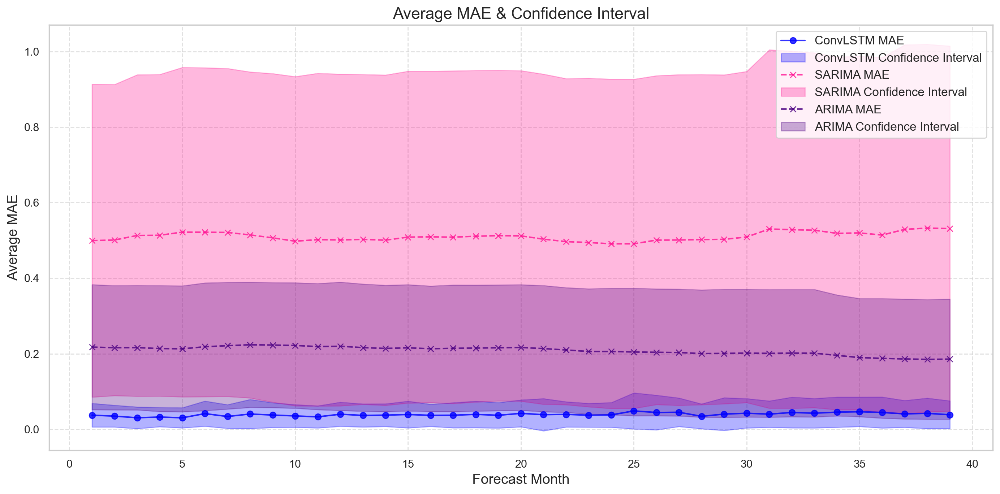

In [87]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM MAE with shaded confidence interval
# plt.plot(range(1, 25), var_step_mae, label='VAR', marker='o', linestyle='-', color='green', alpha=0.8)

# plt.plot(range(1, 25), conv_lstm_sel_step_mae, label='ConvLSTM + Var Sel MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, test_size+1), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, test_size+1),
                 conv_lstm_step_mae - conv_lstm_step_std,
                 conv_lstm_step_mae + conv_lstm_step_std,
                 color='blue', alpha=0.3, label='ConvLSTM Confidence Interval')

# Plot SARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), sarima_step_mae, label='SARIMA MAE', marker='x', linestyle='--', color='deeppink', alpha=0.8)
plt.fill_between(range(1, test_size+1),
                 sarima_step_mae - sarima_step_std,
                 sarima_step_mae + sarima_step_std,
                 color='deeppink', alpha=0.3, label='SARIMA Confidence Interval')

# Plot ARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), arima_step_mae, label='ARIMA MAE', marker='x', linestyle='--', color='indigo', alpha=0.8)
plt.fill_between(range(1, test_size+1),
                 arima_step_mae - arima_step_std,
                 arima_step_mae + arima_step_std,
                 color='indigo', alpha=0.3, label='ARIMA Confidence Interval')

# Customize the plot
plt.title('Average MAE & Confidence Interval', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



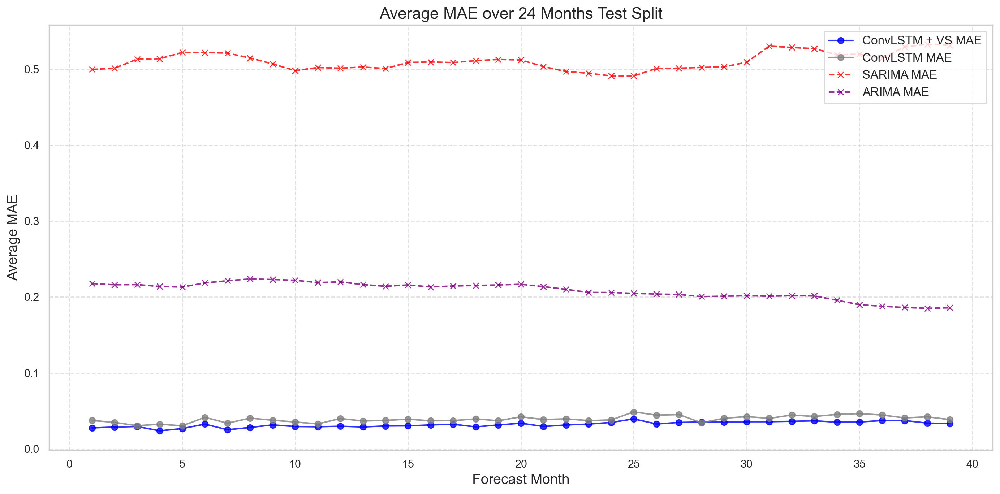

In [90]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM MAE with shaded confidence interval

# plt.plot(range(1, test_size+1), var_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='green', alpha=0.8)

plt.plot(range(1, test_size+1), conv_lstm_sel_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, test_size+1), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='gray', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_step_mae - conv_lstm_step_std,
#                  conv_lstm_step_mae + conv_lstm_step_std,
#                  color='blue', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot SARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), sarima_step_mae, label='SARIMA MAE', marker='x', linestyle='--', color='red', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  sarima_step_mae - sarima_step_std,
#                  sarima_step_mae + sarima_step_std,
#                  color='red', alpha=0.2, label='SARIMA Confidence Interval')

# Plot ARIMA MAE with shaded confidence interval
plt.plot(range(1, test_size+1), arima_step_mae, label='ARIMA MAE', marker='x', linestyle='--', color='purple', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  arima_step_mae - arima_step_std,
#                  arima_step_mae + arima_step_std,
#                  color='purple', alpha=0.2, label='ARIMA Confidence Interval')

# Customize the plot
plt.title('Average MAE over 24 Months Test Split', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



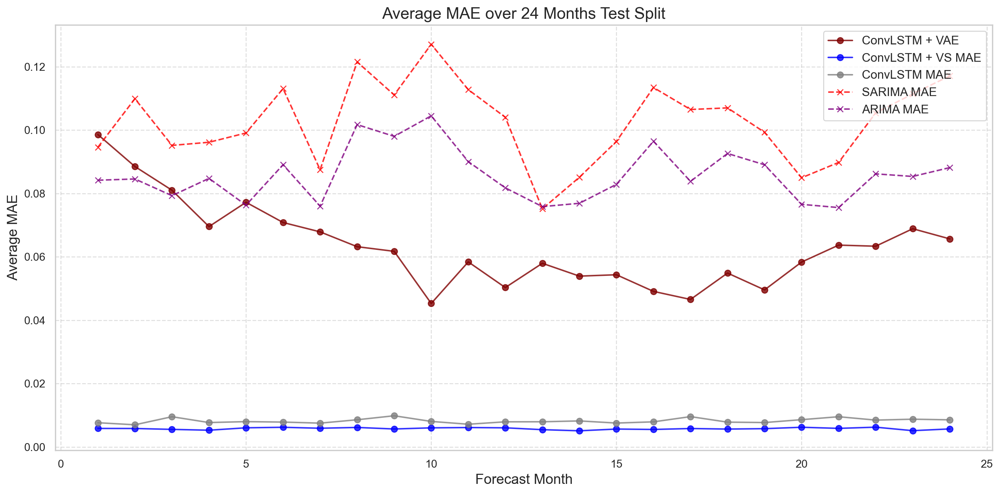

In [273]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM MAE with shaded confidence interval

# plt.plot(range(1, 25), var_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='green', alpha=0.8)
plt.plot(range(1, 25), conv_lstm_vae_step_mae, label='ConvLSTM + VAE', marker='o', linestyle='-', color='maroon', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

plt.plot(range(1, 25), conv_lstm_sel_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
#                  conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
#                  color='gray', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, 25), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='gray', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  conv_lstm_step_mae - conv_lstm_step_std,
#                  conv_lstm_step_mae + conv_lstm_step_std,
#                  color='blue', alpha=0.2, label='ConvLSTM Confidence Interval')

# Plot SARIMA MAE with shaded confidence interval
plt.plot(range(1, 25), sarima_step_mae, label='SARIMA MAE', marker='x', linestyle='--', color='red', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  sarima_step_mae - sarima_step_std,
#                  sarima_step_mae + sarima_step_std,
#                  color='red', alpha=0.2, label='SARIMA Confidence Interval')

# Plot ARIMA MAE with shaded confidence interval
plt.plot(range(1, 25), arima_step_mae, label='ARIMA MAE', marker='x', linestyle='--', color='purple', alpha=0.8)
# plt.fill_between(range(1, 25),
#                  arima_step_mae - arima_step_std,
#                  arima_step_mae + arima_step_std,
#                  color='purple', alpha=0.2, label='ARIMA Confidence Interval')

# Customize the plot
plt.title('Average MAE over 24 Months Test Split', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



In [157]:
# Compare performance at each step
conv_lstm_sel_step_errors = np.array(cnn_sel_all_predictions).reshape(100, 24)  # Reshape to (100, 12)
conv_lstm_step_errors = np.array(cnn_all_predictions).reshape(100, 24)

# Calculate standard deviation for each step
conv_lstm_sel_step_std = np.std(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_std = np.std(np.abs(conv_lstm_step_errors), axis=0)  # Standard deviation across 100 runs

# Calculate mean absolute error for each step
conv_lstm_sel_step_mae = np.mean(np.abs(conv_lstm_sel_step_errors), axis=0)
conv_lstm_step_mae = np.mean(np.abs(conv_lstm_step_errors), axis=0)  # Average across 100 runs


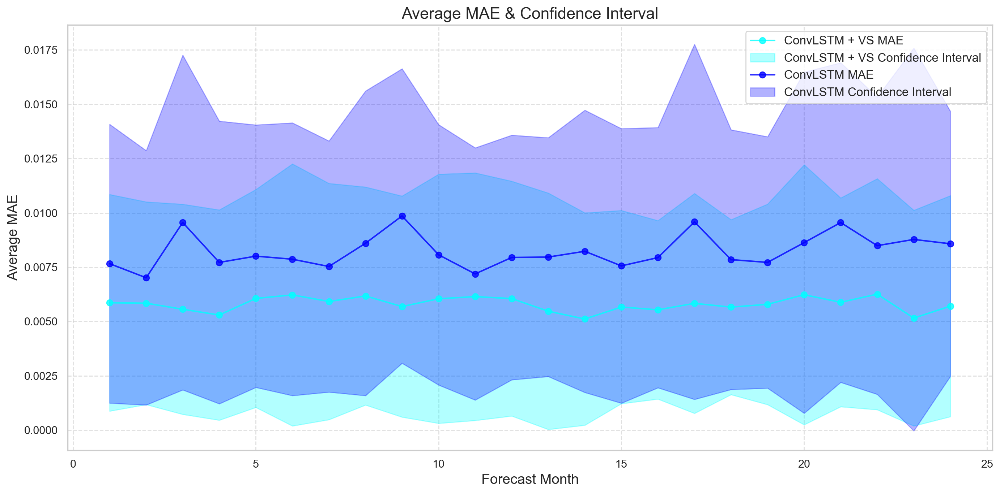

In [158]:


# Plotting
plt.figure(figsize=(14, 7))

# Plot ConvLSTM + Variable Selection MAE with shaded confidence interval
plt.plot(range(1, 25), conv_lstm_sel_step_mae, label='ConvLSTM + VS MAE', marker='o', linestyle='-', color='cyan', alpha=0.8)
plt.fill_between(range(1, 25),
                 conv_lstm_sel_step_mae - conv_lstm_sel_step_std,
                 conv_lstm_sel_step_mae + conv_lstm_sel_step_std,
                 color='cyan', alpha=0.3, label='ConvLSTM + VS Confidence Interval')

# Plot ConvLSTM MAE with shaded confidence interval
plt.plot(range(1, 25), conv_lstm_step_mae, label='ConvLSTM MAE', marker='o', linestyle='-', color='blue', alpha=0.8)
plt.fill_between(range(1, 25),
                 conv_lstm_step_mae - conv_lstm_step_std,
                 conv_lstm_step_mae + conv_lstm_step_std,
                 color='blue', alpha=0.3, label='ConvLSTM Confidence Interval')

# Customize the plot
plt.title('Average MAE & Confidence Interval', fontsize=16)
plt.xlabel('Forecast Month', fontsize=14)
plt.ylabel('Average MAE', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

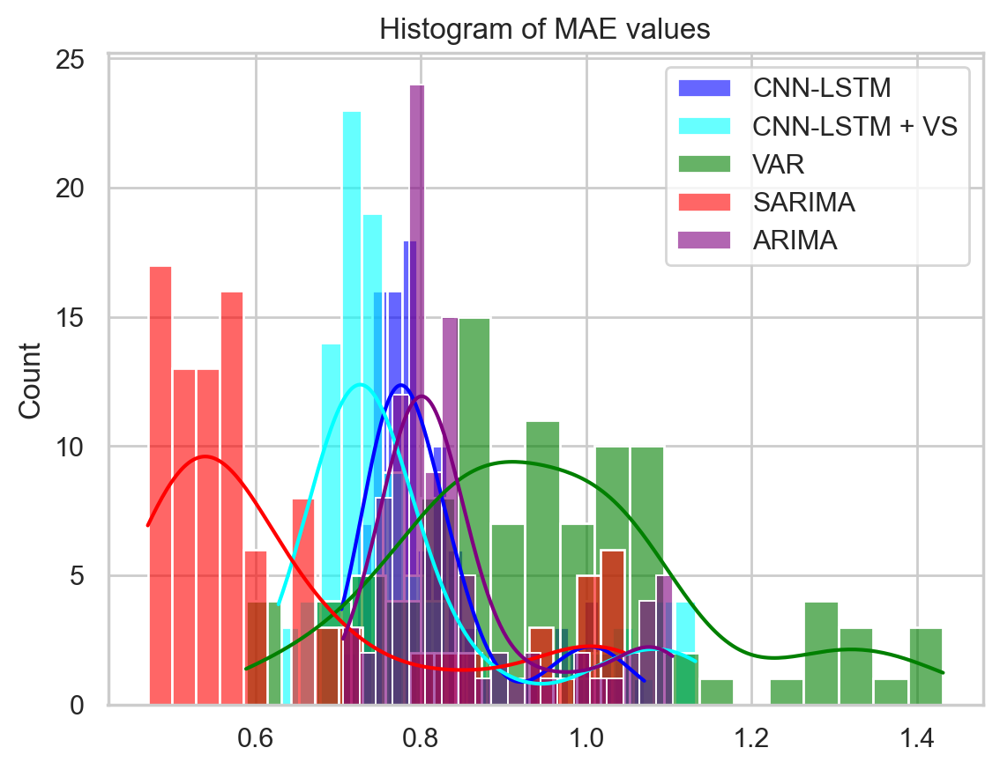

In [91]:
sns.histplot(cnn_maes, kde=True, bins=20, label="CNN-LSTM", color="blue", alpha=0.6)
sns.histplot(cnn_sel_maes, kde=True, bins=20, label="CNN-LSTM + VS", color="cyan", alpha=0.6)
sns.histplot(var_maes, kde=True, bins=20, label="VAR", color="green", alpha=0.6)
sns.histplot(sarima_maes, kde=True, bins=20, label="SARIMA", color="red", alpha=0.6)
sns.histplot(arima_maes, kde=True, bins=20, label="ARIMA", color="purple", alpha=0.6)

plt.legend()
plt.title("Histogram of MAE values")
plt.show()

t.show()
Kolmogorov-Smirnov (K-S) Test
Best for large samples (n > 50).

If p < 0.05, the data is not normally distributed.

In [160]:
from scipy.stats import kstest

print("Kolmogorov-Smirnov (K-S) Test for Normality")
print("if p < 0.05, the data is not normally distributed\n")

stat, p = kstest(cnn_maes, 'norm', args=(np.mean(cnn_maes), np.std(cnn_maes)))
print(f"K-S Test for CNN-LSTM MAE: p-value = {p}")

stat, p = kstest(cnn_sel_maes, 'norm', args=(np.mean(cnn_sel_maes), np.std(cnn_sel_maes)))
print(f"K-S Test for CNN-LSTM + VS MAE: p-value = {p}")

stat, p = kstest(sarima_maes, 'norm', args=(np.mean(sarima_maes), np.std(sarima_maes)))
print(f"K-S Test for SARIMA MAE: p-value = {p}")

stat, p = kstest(arima_maes, 'norm', args=(np.mean(arima_maes), np.std(arima_maes)))
print(f"K-S Test for ARIMA MAE: p-value = {p}")

stat, p = kstest(var_maes, 'norm', args=(np.mean(var_maes), np.std(var_maes)))
print(f"K-S Test for VAR MAE: p-value = {p}")


Kolmogorov-Smirnov (K-S) Test for Normality
if p < 0.05, the data is not normally distributed

K-S Test for CNN-LSTM MAE: p-value = 0.9842448625782724
K-S Test for CNN-LSTM + VS MAE: p-value = 0.9420885913104129
K-S Test for SARIMA MAE: p-value = 0.7691984175168359
K-S Test for ARIMA MAE: p-value = 0.8073766723737531
K-S Test for VAR MAE: p-value = 0.9629974985508127


Significance Test

In [161]:
import scipy.stats as stats

f_statistic, p_value = stats.f_oneway(cnn_maes, cnn_sel_maes, sarima_maes, arima_maes, var_maes)

print(f"ANOVA F-statistic: {f_statistic}, p-value: {p_value}")

# Decision
if p_value < 0.05:
    print("Significant difference found! Proceed with post-hoc analysis.")
else:
    print("No significant difference between the models.")


ANOVA F-statistic: 37.22316392680368, p-value: 3.1521755292005757e-27
Significant difference found! Proceed with post-hoc analysis.


Post-hoc Analysis

Pairwise t-tests with Bonferroni correction

In [162]:
from itertools import combinations

models = {
    "CNN-LSTM": cnn_maes,
    "CNN-LSTM + VS": cnn_sel_maes,
    "SARIMA": sarima_maes,
    "ARIMA": arima_maes,
    "VAR": var_maes
}

# Perform pairwise t-tests with Bonferroni correction
# Generate all possible model pairs
model_pairs = list(combinations(models.keys(), 2))
num_tests = len(model_pairs)  # Number of comparisons

# Bonferroni-adjusted significance level
alpha = 0.05
adjusted_alpha = alpha / num_tests

# Perform paired t-tests and apply Bonferroni correction
results = []
for model1, model2 in model_pairs:
    t_stat, p_value = stats.ttest_rel(models[model1], models[model2])  # Paired T-Test
    significant = p_value < adjusted_alpha  # Check significance after Bonferroni correction
    results.append((model1, model2, p_value, significant))

# Print results
print(f"Bonferroni-adjusted alpha: {adjusted_alpha:.5f}\n")
print(f"{'Model 1':<15}{'Model 2':<15}{'p-value':<20}{'Significant?'}")
print("-" * 60)
for model1, model2, p_value, significant in results:
    print(f"{model1:<15}{model2:<15}{p_value:<20.6f}{'Yes' if significant else 'No'}")



Bonferroni-adjusted alpha: 0.00500

Model 1        Model 2        p-value             Significant?
------------------------------------------------------------
CNN-LSTM       CNN-LSTM + VS  0.544298            No
CNN-LSTM       SARIMA         0.000009            Yes
CNN-LSTM       ARIMA          0.000000            Yes
CNN-LSTM       VAR            0.000000            Yes
CNN-LSTM + VS  SARIMA         0.000007            Yes
CNN-LSTM + VS  ARIMA          0.000000            Yes
CNN-LSTM + VS  VAR            0.000000            Yes
SARIMA         ARIMA          0.375213            No
SARIMA         VAR            0.000000            Yes
ARIMA          VAR            0.000000            Yes


# CODE OF AGES

In [98]:
f_result_Dir = "ForecastResults/"
m_result_Dir = "MAEsResults/"
r_result_Dir = "RMSEsResults/"
read_dir = r_State_Dir

In [58]:
# Function for created multi-step ahead data sets
def shift_target_per_step(data, target_col='CPI', horizon=1):
    data = data.copy()
    data[target_col] = data[target_col].shift(-horizon + 1)
    return data.dropna()

In [ ]:
forecast_horizons = [1, 2, 3]  # Corresponds to dfCPI_L1, dfCPI_L2, dfCPI_L3
num_subsamples = 100

for horizon in forecast_horizons:
    horizon_name = f"dfCPI_L{horizon}"

    # Initialize metrics and forecasts for each model
    metrics = {
        "VAR": {"maes": [], "rmses": [], "forecasts": []},
        "CNN-LSTM": {"maes": [], "rmses": [], "forecasts": []},
        "CNN-LSTM + VS": {"maes": [], "rmses": [], "forecasts": []},
        "SARIMA": {"maes": [], "rmses": [], "forecasts": []},
        "ARIMA": {"maes": [], "rmses": [], "forecasts": []}
    }

    for i in range(num_subsamples):
        filename = f"{horizon_name}_rolling_data_norm_{i+1}.csv"
        file_path = os.path.join(all_LagsCPI_Dir, filename)
        data = pd.read_csv(file_path, index_col=0, parse_dates=True)

        # --- CNN-LSTM ---
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_r(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        _, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        metrics["CNN-LSTM"]["maes"].append(mean_absolute_error(y_test_actual, predictions_actual))
        metrics["CNN-LSTM"]["rmses"].append(np.sqrt(mean_squared_error(y_test_actual, predictions_actual)))
        metrics["CNN-LSTM"]["forecasts"].append(pd.Series(predictions_actual.flatten(), index=test_index))

        # --- CNN-LSTM + Variable Selection ---
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        _, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        metrics["CNN-LSTM + VS"]["maes"].append(mean_absolute_error(y_test_actual, predictions_actual))
        metrics["CNN-LSTM + VS"]["rmses"].append(np.sqrt(mean_squared_error(y_test_actual, predictions_actual)))
        metrics["CNN-LSTM + VS"]["forecasts"].append(pd.Series(predictions_actual.flatten(), index=test_index))

        # --- SARIMA ---
        mae, rmse, forecast = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size=62)
        metrics["SARIMA"]["maes"].append(mae)
        metrics["SARIMA"]["rmses"].append(rmse)
        metrics["SARIMA"]["forecasts"].append(forecast)

        # --- ARIMA ---
        forecast, mae, rmse = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=62)
        metrics["ARIMA"]["maes"].append(mae)
        metrics["ARIMA"]["rmses"].append(rmse)
        metrics["ARIMA"]["forecasts"].append(forecast)

        # --- VAR ---
        mae, rmse, forecast = train_and_evaluate_var_model(data, lag_order, test_size=62)
        metrics["VAR"]["maes"].append(mae)
        metrics["VAR"]["rmses"].append(rmse)
        metrics["VAR"]["forecasts"].append(forecast)

    # --- Save Forecasts ---
    for model_name, values in metrics.items():
        forecast_df = pd.concat(values["forecasts"], axis=1)
        forecast_df.columns = [f"Forecast_{i+1}" for i in range(len(values["forecasts"]))]
        forecast_path = os.path.join(f_result_Dir, f"{model_name.replace(' ', '_')}_forecasts_{horizon}_month_ahead.csv")
        forecast_df.to_csv(forecast_path)

    # --- Save Metrics ---
    maes_df = pd.DataFrame({model: data["maes"] for model, data in metrics.items()})
    maes_df.to_csv(os.path.join(m_result_Dir, f"maess_{horizon}_month_ahead.csv"), index=False)

    rmses_df = pd.DataFrame({model: data["rmses"] for model, data in metrics.items()})
    rmses_df.to_csv(os.path.join(r_result_Dir, f"rmses_{horizon}_month_ahead.csv"), index=False)

    print(f"[{horizon_name}] Forecasts and metrics saved for {horizon}-month ahead.")


In [96]:

forecast_horizons = [1, 2, 3]

for steps in forecast_horizons:

    # Initialize lists for each model
    var_maes, var_rmses, var_all_forecasts = [], [], []
    cnn_maes, cnn_rmses, cnn_all_predictions = [], [], []
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        # data = shift_target_per_step(pd.read_csv(file_path), horizon=steps)

        # CNN-LSTM model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_r(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_maes.append(mae)
        cnn_rmses.append(rmse)
        predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        cnn_all_predictions.append(predictions_series)

        # CNN-LSTM + VarSel model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae_cnn_sel = mean_absolute_error(y_test_actual, predictions_actual)
        rmse_cnn_sel = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_sel_maes.append(mae_cnn_sel)
        cnn_sel_rmses.append(rmse_cnn_sel)
        predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        cnn_sel_all_predictions.append(predictions_series)

        # SARIMA model
        mae_sarima, rmse_sarima, forecasted_sarima = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size=62)
        sarima_maes.append(mae_sarima)
        sarima_rmses.append(rmse_sarima)
        sarima_all_forecasts.append(forecasted_sarima)

        # ARIMA model
        forecasted_arima, mae_arima, rmse_arima = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=62)
        arima_maes.append(mae_arima)
        arima_rmses.append(rmse_arima)
        arima_all_forecasts.append(forecasted_arima)

        # VAR model
        mae_var, rmse_var, forecasted_var = train_and_evaluate_var_model(data, lag_order, test_size=62)
        var_maes.append(mae_var)
        var_rmses.append(rmse_var)
        var_all_forecasts.append(forecasted_var)

    models_maes = {
        "CNN-LSTM": cnn_maes,
        "CNN-LSTM + VS": cnn_sel_maes,
        "SARIMA": sarima_maes,
        "ARIMA": arima_maes,
        "VAR": var_maes
    }

    models_rmses = {
        "CNN-LSTM": cnn_rmses,
        "CNN-LSTM + VS": cnn_sel_rmses,
        "SARIMA": sarima_rmses,
        "ARIMA": arima_rmses,
        "VAR": var_rmses
    }

    sarima_forecast_df = pd.concat(sarima_all_forecasts, axis=1)
    sarima_forecast_df.columns = [f"Forecast_{i+1}" for i in range(len(sarima_all_forecasts))]

    cnn_all_predictions_df = pd.concat(cnn_all_predictions, axis=1)
    cnn_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_all_predictions))]

    cnn_sel_all_predictions_df = pd.concat(cnn_sel_all_predictions, axis=1)
    cnn_sel_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_sel_all_predictions))]

    arima_all_forecasts_df = pd.concat(arima_all_forecasts, axis=1)
    arima_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(arima_all_forecasts))]

    var_all_forecasts_df = pd.concat(var_all_forecasts, axis=1)
    var_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(var_all_forecasts))]


    models_forecasts = {
        "CNN-LSTM": cnn_all_predictions_df,
        "CNN-LSTM + VS": cnn_sel_all_predictions_df,
        "SARIMA":  sarima_forecast_df,
        "ARIMA": arima_all_forecasts_df,
        "VAR": var_all_forecasts_df
    }

    # Save each model's forecast as a separate CSV file
    for model_name, df in models_forecasts.items():
        output_path = os.path.join(f_result_Dir, f"{model_name.replace(' ', '_')}_forecasts_{steps}_month_ahead.csv")
        df.to_csv(output_path)

    maes_df = pd.DataFrame(models_maes)
    maes_df.to_csv(os.path.join(m_result_Dir, f"maess_{steps}_month_ahead.csv"), index=False)

    rmses_df = pd.DataFrame(models_rmses)
    rmses_df.to_csv(os.path.join(r_result_Dir, f"rmses_{steps}_month_ahead.csv"), index=False)

    print(f"Forecasts and MAEs for {steps}-month ahead saved to CSV files.")

Forecasts and MAEs for 1-month ahead saved to CSV files.
Forecasts and MAEs for 2-month ahead saved to CSV files.
Forecasts and MAEs for 3-month ahead saved to CSV files.


In [101]:

forecast_horizons = [1, 2, 3, 4, 5, 6, 7, 8, 9, 9, 10, 11, 12]

for steps in forecast_horizons:

    # Initialize lists for each model
    var_maes, var_rmses, var_all_forecasts = [], [], []
    cnn_maes, cnn_rmses, cnn_all_predictions = [], [], []
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        data = shift_target_per_step(pd.read_csv(file_path), horizon=steps)

        # CNN-LSTM model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_r(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_maes.append(mae)
        # cnn_rmses.append(rmse)
        # predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        # cnn_all_predictions.append(predictions_series)

        # CNN-LSTM + VarSel model
        X_train, y_train, X_test, y_test, scaler_y, test_index = prep_data_for_cnn_var_sel(data, 'CPI', test_size=62)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
        mae_cnn_sel = mean_absolute_error(y_test_actual, predictions_actual)
        rmse_cnn_sel = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
        cnn_sel_maes.append(mae_cnn_sel)
        # cnn_sel_rmses.append(rmse_cnn_sel)
        # predictions_series = pd.Series(predictions_actual.flatten(), index=test_index)
        # cnn_sel_all_predictions.append(predictions_series)

        # SARIMA model
        mae_sarima, rmse_sarima, forecasted_sarima = train_and_evaluate_sarima_model(data, auto_arima_model_sarima, test_size=62)
        sarima_maes.append(mae_sarima)
        # sarima_rmses.append(rmse_sarima)
        # sarima_all_forecasts.append(forecasted_sarima)

        # ARIMA model
        forecasted_arima, mae_arima, rmse_arima = train_and_evaluate_arima_model(data, auto_arima_model_arima, test_size=62)
        arima_maes.append(mae_arima)
        # arima_rmses.append(rmse_arima)
        # arima_all_forecasts.append(forecasted_arima)

        # VAR model
        mae_var, rmse_var, forecasted_var = train_and_evaluate_var_model(data, lag_order, test_size=62)
        var_maes.append(mae_var)
        # var_rmses.append(rmse_var)
        # var_all_forecasts.append(forecasted_var)

    models_maes = {
        "CNN-LSTM": cnn_maes,
        "CNN-LSTM + VS": cnn_sel_maes,
        "SARIMA": sarima_maes,
        "ARIMA": arima_maes,
        "VAR": var_maes
    }

    # models_rmses = {
    #     "CNN-LSTM": cnn_rmses,
    #     "CNN-LSTM + VS": cnn_sel_rmses,
    #     "SARIMA": sarima_rmses,
    #     "ARIMA": arima_rmses,
    #     "VAR": var_rmses
    # }

    # sarima_forecast_df = pd.concat(sarima_all_forecasts, axis=1)
    # sarima_forecast_df.columns = [f"Forecast_{i+1}" for i in range(len(sarima_all_forecasts))]
    # 
    # cnn_all_predictions_df = pd.concat(cnn_all_predictions, axis=1)
    # cnn_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_all_predictions))]
    # 
    # cnn_sel_all_predictions_df = pd.concat(cnn_sel_all_predictions, axis=1)
    # cnn_sel_all_predictions_df.columns = [f"Forecast_{i+1}" for i in range(len(cnn_sel_all_predictions))]
    # 
    # arima_all_forecasts_df = pd.concat(arima_all_forecasts, axis=1)
    # arima_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(arima_all_forecasts))]
    # 
    # var_all_forecasts_df = pd.concat(var_all_forecasts, axis=1)
    # var_all_forecasts_df.columns = [f"Forecast_{i+1}" for i in range(len(var_all_forecasts))]
    # 

    # models_forecasts = {
    #     "CNN-LSTM": cnn_all_predictions_df,
    #     "CNN-LSTM + VS": cnn_sel_all_predictions_df,
    #     "SARIMA":  sarima_forecast_df,
    #     "ARIMA": arima_all_forecasts_df,
    #     "VAR": var_all_forecasts_df
    # }

    # Save each model's forecast as a separate CSV file
    for model_name, df in models_forecasts.items():
        output_path = os.path.join(f_result_Dir, f"{model_name.replace(' ', '_')}_forecasts_{steps}_month_ahead.csv")
        df.to_csv(output_path)

    maes_df = pd.DataFrame(models_maes)
    maes_df.to_csv(os.path.join(m_result_Dir, f"maess_{steps}_month_ahead.csv"), index=False)
    # 
    # rmses_df = pd.DataFrame(models_rmses)
    # rmses_df.to_csv(os.path.join(r_result_Dir, f"rmses_{steps}_month_ahead.csv"), index=False)

    print(f"Forecasts and MAEs for {steps}-month ahead saved to CSV files.")

Forecasts and MAEs for 1-month ahead saved to CSV files.
Forecasts and MAEs for 2-month ahead saved to CSV files.
Forecasts and MAEs for 3-month ahead saved to CSV files.
Forecasts and MAEs for 4-month ahead saved to CSV files.
Forecasts and MAEs for 5-month ahead saved to CSV files.
Forecasts and MAEs for 6-month ahead saved to CSV files.
Forecasts and MAEs for 7-month ahead saved to CSV files.
Forecasts and MAEs for 8-month ahead saved to CSV files.
Forecasts and MAEs for 9-month ahead saved to CSV files.
Forecasts and MAEs for 9-month ahead saved to CSV files.
Forecasts and MAEs for 10-month ahead saved to CSV files.
Forecasts and MAEs for 11-month ahead saved to CSV files.
Forecasts and MAEs for 12-month ahead saved to CSV files.


Forecasts and MAEs for 10-month ahead saved to CSV files.
Forecasts and MAEs for 11-month ahead saved to CSV files.
Forecasts and MAEs for 12-month ahead saved to CSV files.


In [81]:
print(f"Auto ARIMA Order: {auto_arima_model_sarima.order}")
print(f"Auto ARIMA Seasonal Order: {auto_arima_model_sarima.seasonal_order}")

print(len(data) // 5)

Auto ARIMA Order: (0, 0, 4)
Auto ARIMA Seasonal Order: (1, 0, 1, 12)
62


# JUNK

# IGNORE

In [ ]:
forecast_horizons = [1, 2, 3]

var_results = {}
cnn_sel_results = {}
sarima_results = {}
arima_results = {}


for steps in forecast_horizons:

    # VAR model for each random state
    var_maes, var_rmses, var_all_forecasts = [], [], []
    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        data = random_data.copy()

        mae, rmse, forecasted_cpiauscl = train_and_evaluate_var_model(data, lag_order, steps=steps)
        var_maes.append(mae)
        var_rmses.append(rmse)
        var_all_forecasts.append(forecasted_cpiauscl)

    # var_results[f"{steps}_month_ahead"] = {
    #     "maes": var_maes,
    #     "rmses": var_rmses,
    #     "forecasts": var_all_forecasts
    # }

    # CNN-LSTM + VarSel model for each random state
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []
    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        shuffled_data = pd.read_csv(file_path)

        X_train, y_train, X_test, y_test, scaler_y = prep_data_for_cnn_var_sel(shuffled_data, 'CPI', forecast_horizon=steps, test_size=24)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)

        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)

        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))

        cnn_sel_maes.append(mae)
        cnn_sel_rmses.append(rmse)
        cnn_sel_all_predictions.append(predictions)

    # cnn_sel_results[f"{steps}_month_ahead"] = {
    #     "maes": cnn_sel_maes,
    #     "rmses": cnn_sel_rmses,
    #     "forecasts": cnn_sel_all_predictions
    # }

    # SARIMA model for each random state
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []
    for i in range(100):
        # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        mae, rmse, forecasted_cpiauscl = train_and_evaluate_sarima_model(data, auto_arima_model_sarima)
        sarima_maes.append(mae)
        sarima_rmses.append(rmse)
        sarima_all_forecasts.append(forecasted_cpiauscl)

    # sarima_results[f"{steps}_month_ahead"] = {
    #     "maes": sarima_maes,
    #     "rmses": sarima_rmses,
    #     "forecasts": sarima_all_forecasts
    # }

    # ARIMA model for each random state
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []
    for i in range(100):
        # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        train_df = data.iloc[:-24]
        test_df = data.iloc[-24:]
        forecasted_cpi, mae, rmse = train_and_evaluate_arima_model(train_df, test_df, auto_arima_model_arima)
        arima_maes.append(mae)
        arima_rmses.append(rmse)
        arima_all_forecasts.append(forecasted_cpi)

    # sarima_results[f"{steps}_month_ahead"] = {
    #     "maes": sarima_maes,
    #     "rmses": sarima_rmses,
    #     "forecasts": sarima_all_forecasts
    # }

    models_maes = {
        "CNN-LSTM": cnn_maes,
        "CNN-LSTM + VS": cnn_sel_maes,
        "SARIMA": sarima_maes,
        "ARIMA": arima_maes,
        "VAR": var_maes
    }
    
    models_forecasts = {
        "CNN-LSTM": cnn_all_predictions,
        "CNN-LSTM + VS": cnn_sel_all_predictions,
        "SARIMA": sarima_all_forecasts,
        "ARIMA": arima_all_forecasts,
        "VAR": var_all_forecasts
    }

    # --- Save the forecasts to a CSV file ---
    forecasts_df = pd.DataFrame(models_forecasts)
    forecasts_df.to_csv(f"forecasts_{steps}_month_ahead.csv", index=False)
    # --- Save the MAEs to a CSV file ---
    maes_df = pd.DataFrame(models_maes)
    maes_df.to_csv(f"maes_{steps}_month_ahead.csv", index=False)
    
    print(f"Forecasts and MAEs for {steps}-month ahead saved to CSV files.")





In [ ]:
forecast_horizons = [1, 2, 3]

var_results = {}
for steps in forecast_horizons:
    var_maes, var_rmses, var_all_forecasts = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        data = random_data.copy()

        mae, rmse, forecasted_cpiauscl = train_and_evaluate_var_model(data, lag_order, steps=steps)
        var_maes.append(mae)
        var_rmses.append(rmse)
        var_all_forecasts.append(forecasted_cpiauscl)

    var_results[f"{steps}_month_ahead"] = {
        "maes": var_maes,
        "rmses": var_rmses,
        "forecasts": var_all_forecasts
    }

cnn_sel_results = {}
for steps in forecast_horizons:
    cnn_sel_maes, cnn_sel_rmses, cnn_sel_all_predictions = [], [], []

    for i in range(100):
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        shuffled_data = pd.read_csv(file_path)
    
        X_train, y_train, X_test, y_test, scaler_y = prep_data_for_cnn_var_sel(shuffled_data, 'CPI', forecast_horizon=steps, test_size=24)
        model = build_model((1, 1, 1, X_train.shape[-1]))
        loss, predictions = evaluate_model(model, X_test, y_test)
    
        y_test_actual = inverse_transform(scaler_y, y_test)
        predictions_actual = inverse_transform(scaler_y, predictions)
    
        mae = mean_absolute_error(y_test_actual, predictions_actual)
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions_actual))
    
        cnn_sel_maes.append(mae)
        cnn_sel_rmses.append(rmse)
        cnn_sel_all_predictions.append(predictions)

    cnn_sel_results[f"{steps}_month_ahead"] = {
        "maes": cnn_sel_maes,
        "rmses": cnn_sel_rmses,
        "forecasts": cnn_sel_all_predictions
    }


sarima_results = {}
for steps in forecast_horizons:
    sarima_maes, sarima_rmses, sarima_all_forecasts = [], [], []

    for i in range(100):
    # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        mae, rmse, forecasted_cpiauscl = train_and_evaluate_sarima_model(data, auto_arima_model_sarima)
        sarima_maes.append(mae)
        sarima_rmses.append(rmse)
        sarima_all_forecasts.append(forecasted_cpiauscl)

    sarima_results[f"{steps}_month_ahead"] = {
        "maes": sarima_maes,
        "rmses": sarima_rmses,
        "forecasts": sarima_all_forecasts
    }

arima_results = {}
for steps in forecast_horizons:
    arima_maes, arima_rmses, arima_all_forecasts = [], [], []

    for i in range(100):
    # Read shuffled data from CSV file
        file_path = os.path.join(read_dir, f"random_data_{i+1}.csv")
        random_data = pd.read_csv(file_path)
        # Create data DataFrame with selected columns
        data = random_data.copy()
        train_df = data.iloc[:-24]
        test_df = data.iloc[-24:]
        forecasted_cpi, mae, rmse = train_and_evaluate_arima_model(train_df, test_df, auto_arima_model_arima)
        arima_maes.append(mae)
        arima_rmses.append(rmse)
        arima_all_forecasts.append(forecasted_cpi)

    sarima_results[f"{steps}_month_ahead"] = {
        "maes": sarima_maes,
        "rmses": sarima_rmses,
        "forecasts": sarima_all_forecasts
    }


